In [1]:
import pandas as pd
import numpy as np
import joblib

load_path = "/Users/bg.lim/Downloads/TAMU_Agri/New_CGM/"

# 불러오기
X_alerts = pd.read_csv(load_path + "X_alerts.csv")
X_scaled = np.load(load_path + "X_scaled.npy")
shap_pos_clipped = np.load(load_path + "shap_pos_clipped.npy")
FEATURES = joblib.load(load_path + "FEATURES.pkl")

print("불러오기 완료!")
print("X_alerts shape:", X_alerts.shape)
print("X_scaled shape:", X_scaled.shape)
print("shap_pos_clipped shape:", shap_pos_clipped.shape)
print("FEATURES 개수:", len(FEATURES))


불러오기 완료!
X_alerts shape: (692, 61)
X_scaled shape: (692, 61)
shap_pos_clipped shape: (692, 61)
FEATURES 개수: 61


In [89]:
# alerts_with_X 저장
save_path = "/Users/bg.lim/Downloads/TAMU_Agri/New_CGM/alerts_with_sses.csv"
alerts_with_sses.to_csv(save_path, index=False)

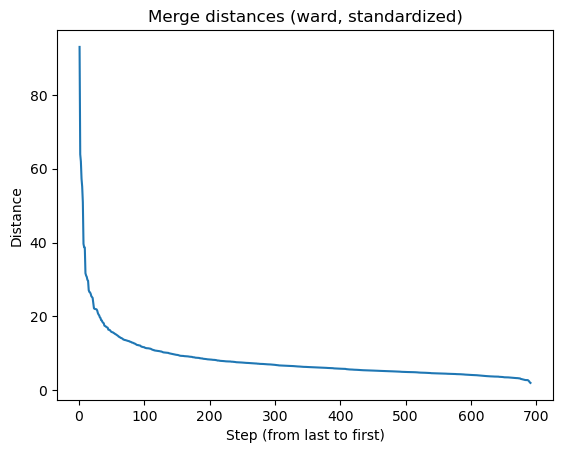

Natural cut point suggests ~2 clusters
{1: 557, 2: 135}


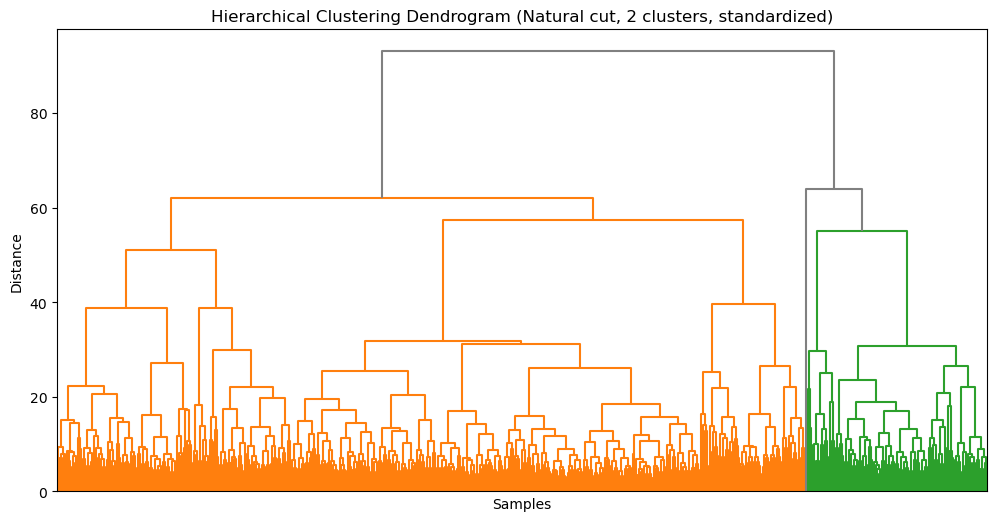

In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# === 1) Standardize features ===
X_raw = X_alerts.copy().fillna(0)  # raw 데이터프레임 사용
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)

# === 2) linkage 계산 ===
Z = linkage(X_scaled, method="ward")

# === 3) 병합 거리 확인 ===
distances = Z[:, 2]  # 세 번째 열이 병합 거리
plt.plot(range(1, len(distances)+1), distances[::-1])  # 큰 것부터 보기 쉽게 역순
plt.title("Merge distances (ward, standardized)")
plt.xlabel("Step (from last to first)")
plt.ylabel("Distance")
plt.show()

# === 4) 가장 큰 점프 찾기 (natural cut point) ===
diffs = np.diff(distances)
cut_idx = np.argmax(diffs)
n_clusters = len(distances) - cut_idx
print(f"Natural cut point suggests ~{n_clusters} clusters")

# === 5) 해당 natural cut point로 클러스터링 ===
clusters = fcluster(Z, t=distances[cut_idx], criterion="distance")

# === 6) 결과 확인 ===
unique, counts = np.unique(clusters, return_counts=True)
print(dict(zip(unique, counts)))

# === 7) 덴도그램 시각화 ===
plt.figure(figsize=(12, 6))
dendrogram(
    Z,
    color_threshold=distances[cut_idx],
    above_threshold_color="gray",
    no_labels=True
)
plt.title(f"Hierarchical Clustering Dendrogram (Natural cut, {n_clusters} clusters, standardized)")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()

# === 8) 클러스터 라벨 붙이기 ===
X_with_cluster = X_raw.copy()
X_with_cluster["Cluster"] = clusters


In [99]:
# 평균과 표준편차 확인
means = X_scaled.mean(axis=0)
stds = X_scaled.std(axis=0)

print("=== After Standardization ===")
print("Mean (per feature):", np.round(means[:10], 4))  # 앞 10개만 예시 출력
print("Std  (per feature):", np.round(stds[:10], 4))


=== After Standardization ===
Mean (per feature): [ 0. -0.  0.  0.  0. -0.  0. -0.  0.  0.]
Std  (per feature): [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [101]:
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, fcluster

# 1) Standardize raw data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)

# 2) Hierarchical clustering
Z = linkage(X_scaled, method="ward")

# 자연 절단점 (cut point) 기준으로 2개 클러스터
clusters = fcluster(Z, t=distances[cut_idx], criterion="distance")

# 3) Cluster 결과 붙이기
X_with_cluster = X_raw.copy()
X_with_cluster["Cluster"] = clusters


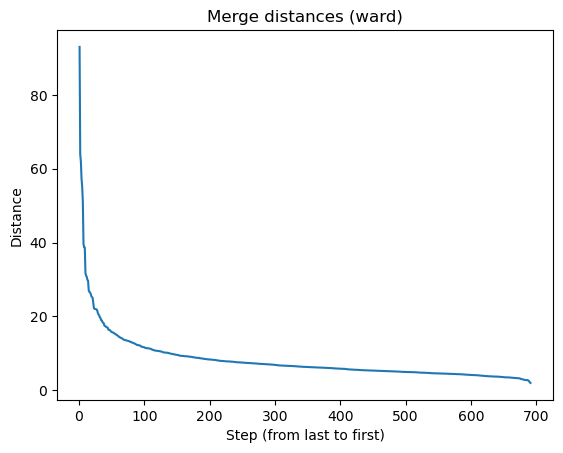

Natural cut point suggests ~2 clusters
{1: 557, 2: 135}


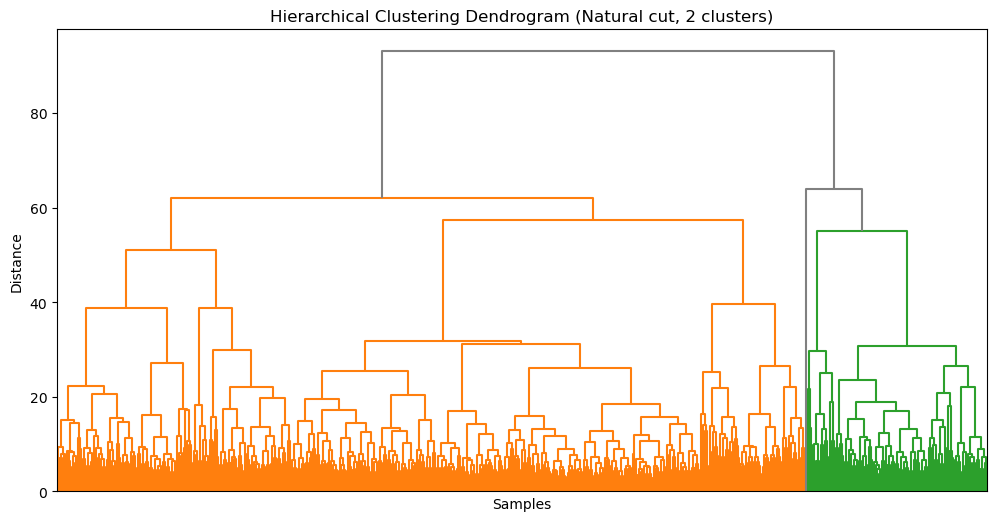

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# === 1) linkage 계산 ===
Z = linkage(X_scaled, method="ward")

# === 2) 병합 거리 확인 ===
distances = Z[:, 2]  # 세 번째 열이 병합 거리
plt.plot(range(1, len(distances)+1), distances[::-1])  # 큰 것부터 보기 쉽게 역순
plt.title("Merge distances (ward)")
plt.xlabel("Step (from last to first)")
plt.ylabel("Distance")
plt.show()

# === 3) 가장 큰 점프 찾기 ===
diffs = np.diff(distances)  # 인접 거리 차이
cut_idx = np.argmax(diffs)  # 점프가 가장 큰 지점
n_clusters = len(distances) - cut_idx  # 클러스터 개수

print(f"Natural cut point suggests ~{n_clusters} clusters")

# === 4) 해당 natural cut point로 클러스터링 ===
clusters = fcluster(Z, t=distances[cut_idx], criterion="distance")

# === 5) 클러스터링 결과 확인 ===
unique, counts = np.unique(clusters, return_counts=True)
print(dict(zip(unique, counts)))

# === 6) 덴도그램 시각화 ===
plt.figure(figsize=(12, 6))
dendrogram(
    Z,
    color_threshold=distances[cut_idx],
    above_threshold_color="gray",
    no_labels=True
)
plt.title(f"Hierarchical Clustering Dendrogram (Natural cut, {n_clusters} clusters)")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()


## Features

In [10]:
X_with_cluster = X_alerts.copy()
X_with_cluster["Cluster"] = clusters
print(X_with_cluster["Cluster"].value_counts())


Cluster
1    557
2    135
Name: count, dtype: int64


In [131]:
X_with_cluster

,15m_G_Diff_5,15m_G_Diff_6,15m_G_Diff_7,15m_G_Diff_8,15m_G_Diff_9,15m_G_Diff_10,Z_Previous_5,Z_Previous_6,Z_Previous_7,Z_Previous_8,...,Intensity,1h_pre_Thre,Glucose_pre_1h,Glucose_pre_1.5h,Glucose_pre_2h,G_minus_T_pre_1.5h,G_minus_T_pre_2h,Threshold_pre_2h,Threshold_pre_1.5h,Cluster
0,-5.0,-4.0,1.0,5.0,-2.0,-12.0,2.106469,2.386559,2.316537,1.966423,...,0.0,92.519585,97.0,106.0,100.0,13.955913,8.624709,91.375291,92.044087,2
1,-1.0,-5.0,-7.0,9.0,10.0,-4.0,1.025054,1.330430,1.757957,1.208280,...,0.0,100.542159,92.0,98.0,96.0,-2.441333,-3.960653,99.960653,100.441333,1
2,-7.0,-2.0,6.0,2.0,0.0,2.0,1.210755,1.330603,0.971057,0.851209,...,1.0,102.079040,91.0,100.0,92.0,-1.813496,-9.489404,101.489404,101.813496,1
3,1.0,-2.0,0.0,-1.0,1.0,-1.0,1.301877,1.411337,1.411337,1.466067,...,0.0,106.717792,105.0,106.0,107.0,-0.290407,1.161024,105.838976,106.290407,2
4,2.0,-1.0,3.0,6.0,3.0,-1.0,1.325703,1.384244,1.208621,0.857374,...,1.0,112.150693,112.0,111.0,102.0,-0.732067,-9.330747,111.330747,111.732067,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
687,-1.0,-2.0,1.0,0.0,0.0,0.0,-0.505118,-0.386917,-0.446018,-0.446018,...,0.0,123.009975,88.0,91.0,90.0,-32.444677,-33.461176,123.461176,123.444677,1
688,0.0,0.0,-1.0,-1.0,1.0,1.0,-1.120790,-1.120790,-1.060883,-1.000976,...,1.0,122.763856,79.0,79.0,81.0,-43.811048,-41.849606,122.849606,122.811048,1
689,2.0,21.0,13.0,2.0,2.0,9.0,2.790836,1.584888,0.838349,0.723497,...,1.0,124.400566,149.0,126.0,111.0,2.200957,-12.598059,123.598059,123.799043,1
690,21.0,11.0,-1.0,0.0,-2.0,-5.0,0.491022,-0.129321,-0.072926,-0.072926,...,0.0,125.658901,129.0,97.0,98.0,-28.484436,-27.486410,125.486410,125.484436,1


# Jointplot with Raw value


=== Cluster 1 ===
Plotting Time_24h vs mean_intensity_1h


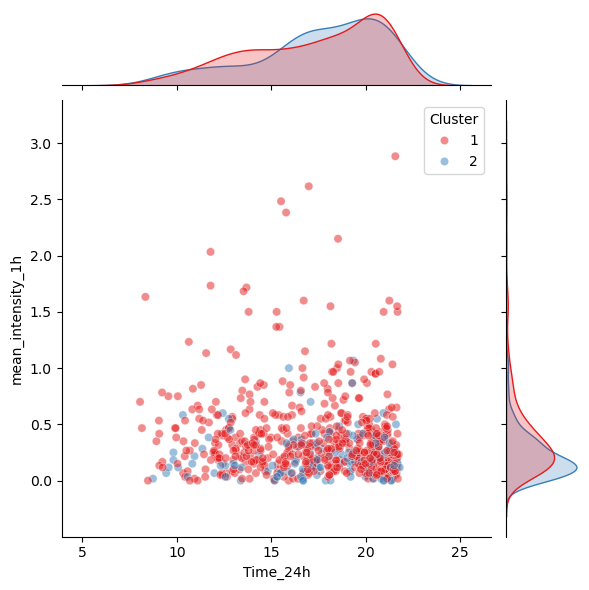

Plotting Time_24h vs hungry


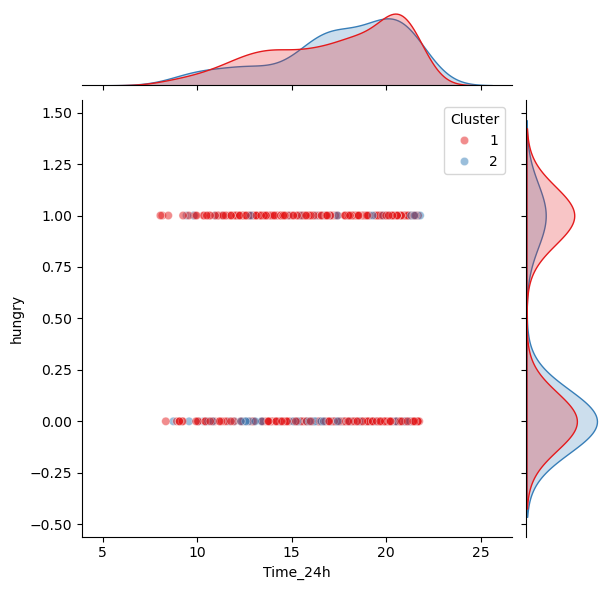

Plotting Time_24h vs Z_Previous_4


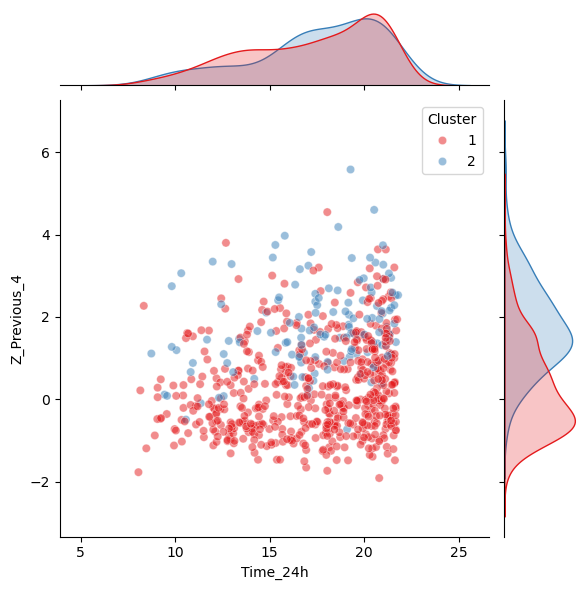

Plotting Time_24h vs 15m_G_Diff_7


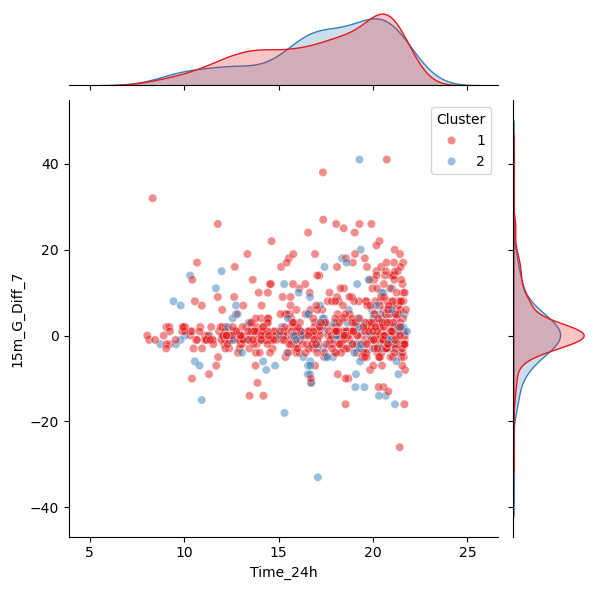

Plotting mean_intensity_1h vs hungry


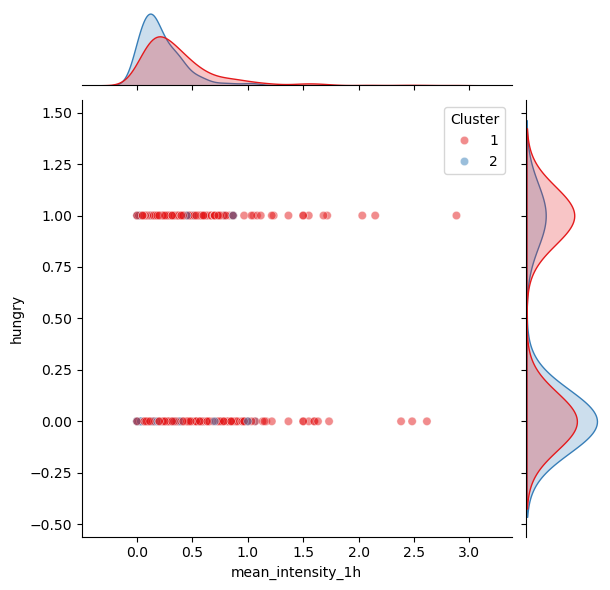

Plotting mean_intensity_1h vs Z_Previous_4


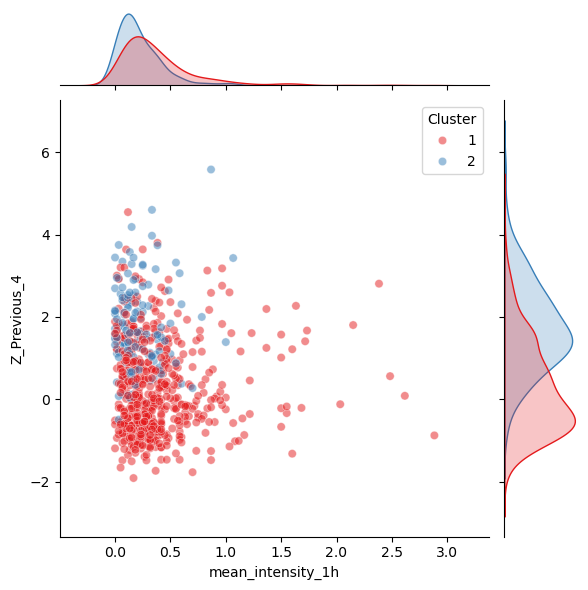

Plotting mean_intensity_1h vs 15m_G_Diff_7


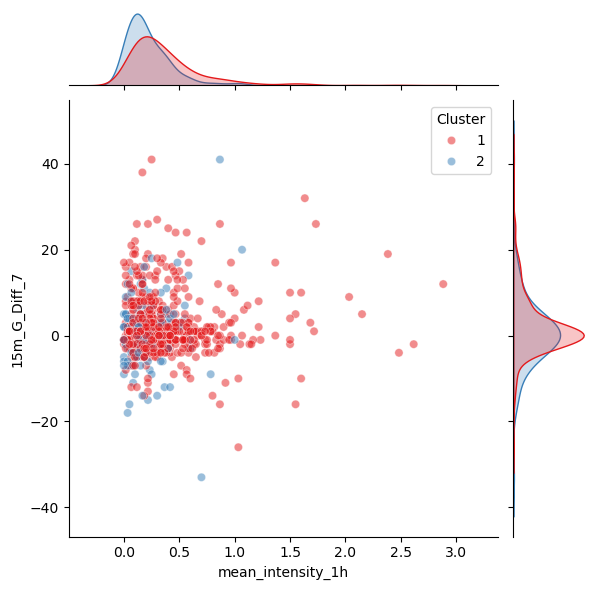

Plotting hungry vs Z_Previous_4


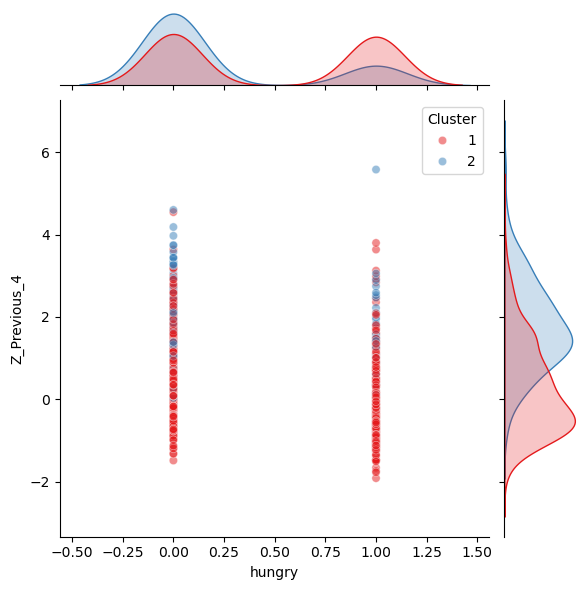

Plotting hungry vs 15m_G_Diff_7


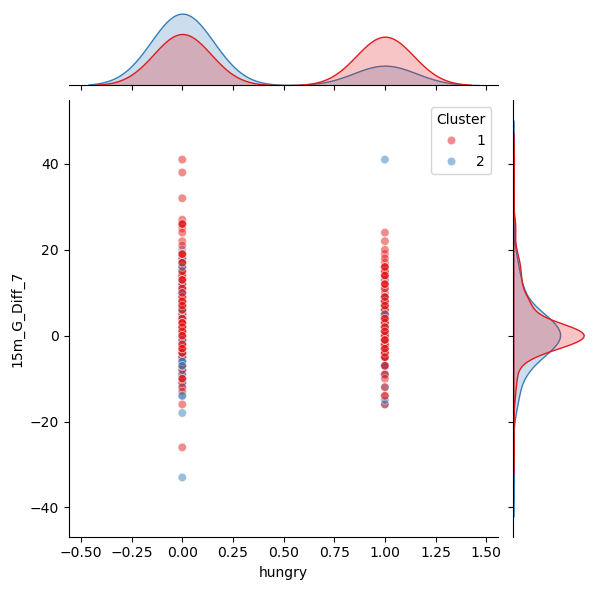

Plotting Z_Previous_4 vs 15m_G_Diff_7


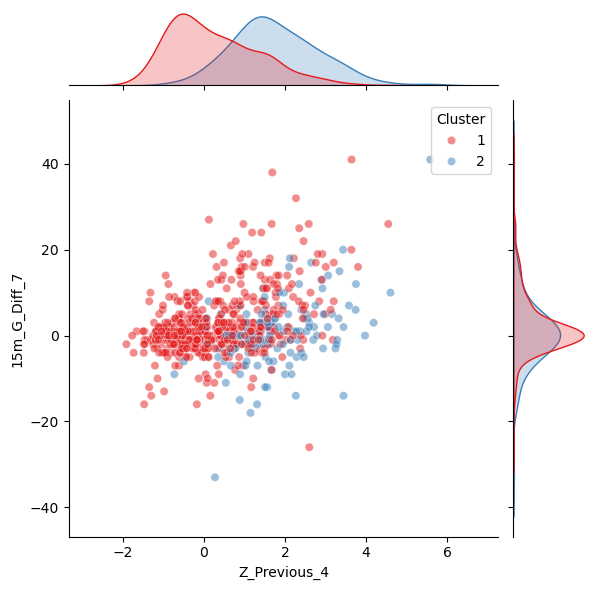


=== Cluster 2 ===
Plotting Z_Previous_4 vs Time_24h


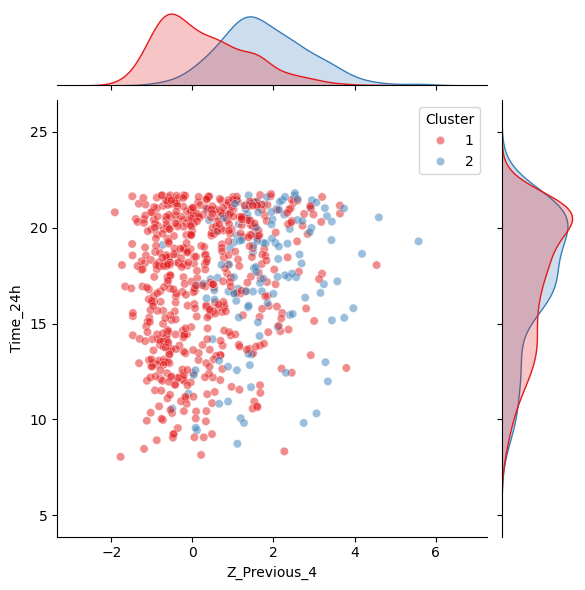

Plotting Z_Previous_4 vs mean_intensity_1h


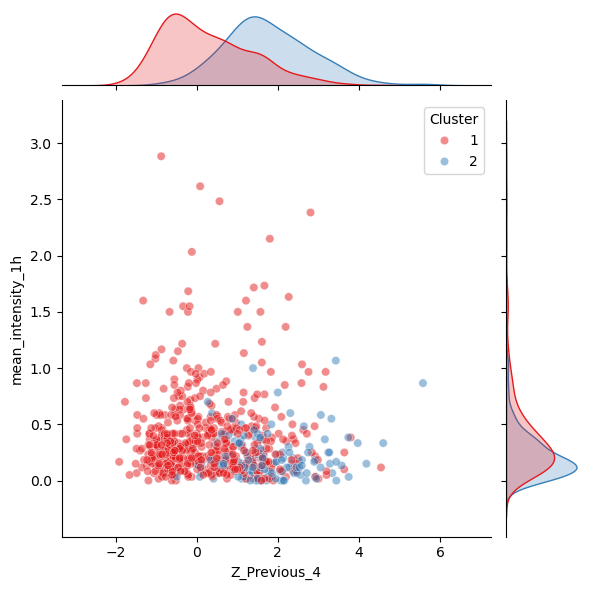

Plotting Z_Previous_4 vs G_minus_T_pre_2h


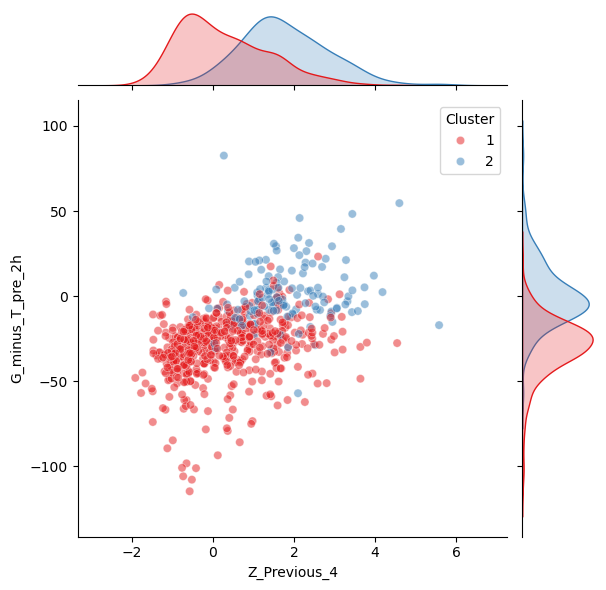

Plotting Z_Previous_4 vs G_minus_T_pre_1.5h


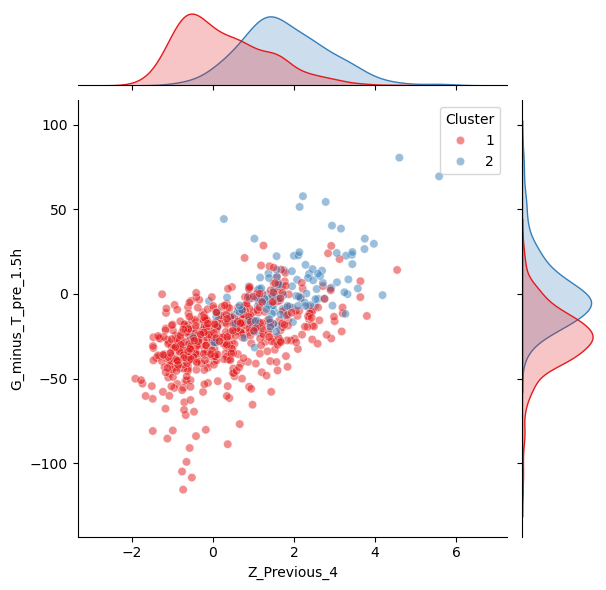

Plotting Time_24h vs mean_intensity_1h


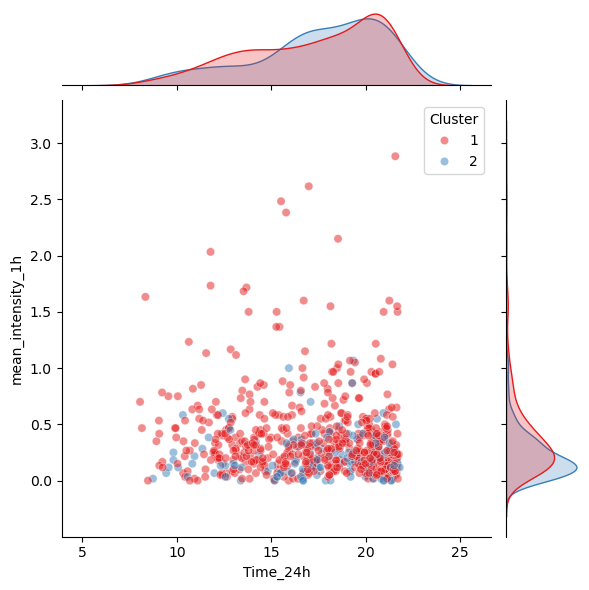

Plotting Time_24h vs G_minus_T_pre_2h


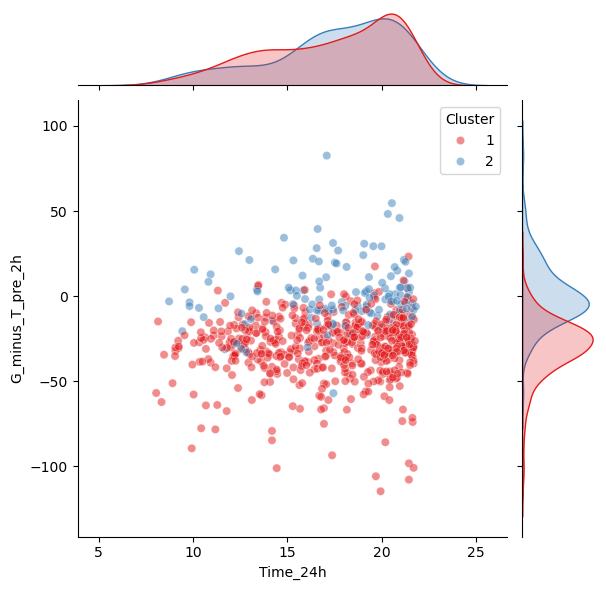

Plotting Time_24h vs G_minus_T_pre_1.5h


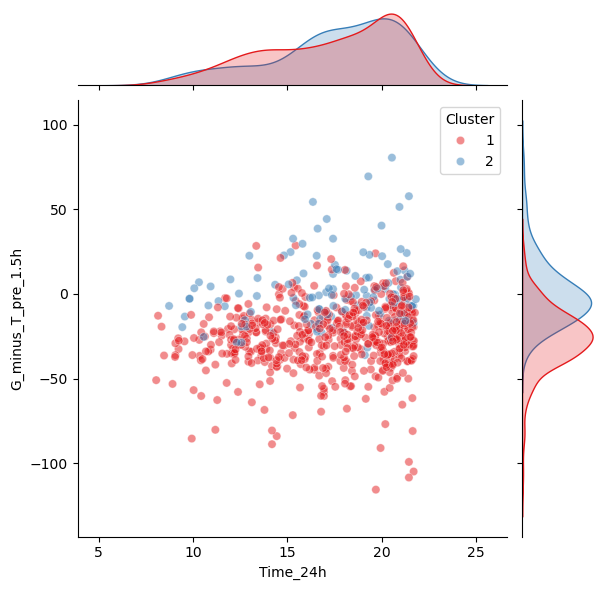

Plotting mean_intensity_1h vs G_minus_T_pre_2h


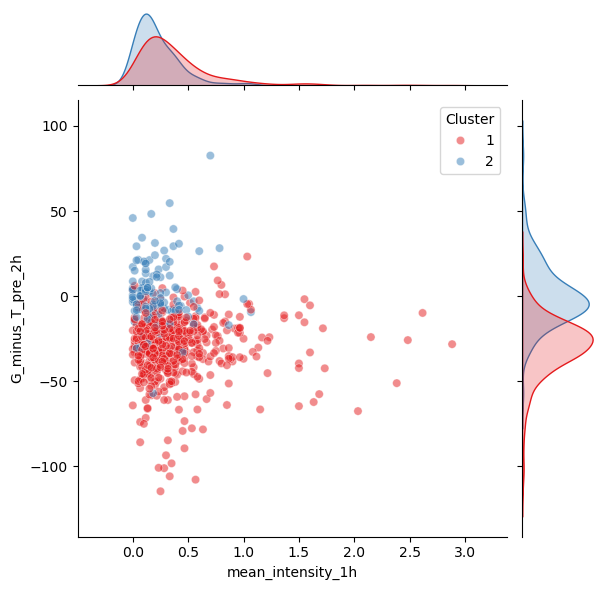

Plotting mean_intensity_1h vs G_minus_T_pre_1.5h


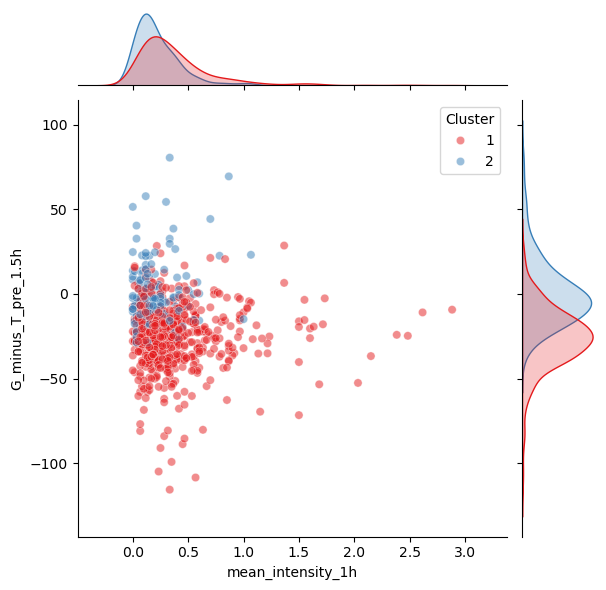

Plotting G_minus_T_pre_2h vs G_minus_T_pre_1.5h


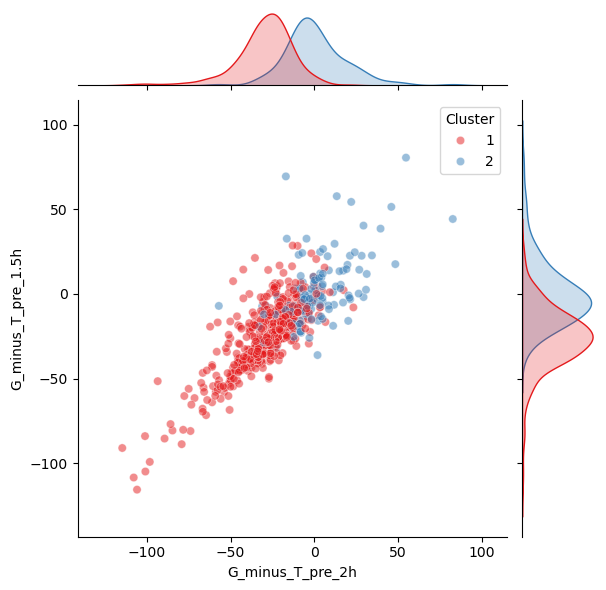

In [133]:
# === 5) Cluster 1,2 데이터 (원본 값) 준비 ===
df_plot_raw = X_with_cluster[X_with_cluster["Cluster"].isin([1,2])]

# === 6) 각 클러스터별 Top5 feature 조합 시각화 (원본 값) ===
for clust, feats in top_feats.items():
    print(f"\n=== Cluster {clust} ===")
    for f1, f2 in itertools.combinations(feats, 2):
        print(f"Plotting {f1} vs {f2}")
        sns.jointplot(
            data=df_plot_raw,
            x=f1, y=f2,
            hue="Cluster",
            marginal_kws=dict(common_norm=False, fill=True),
            palette="Set1",
            alpha=0.5
        )
        plt.show()


# Jointplot with scaled value

=== Top5 features per cluster (from SHAP) ===
Cluster 1: ['Time_24h', 'mean_intensity_1h', 'hungry', 'Z_Previous_4', '15m_G_Diff_7']
Cluster 2: ['Z_Previous_4', 'Time_24h', 'mean_intensity_1h', 'G_minus_T_pre_2h', 'G_minus_T_pre_1.5h']

=== Cluster 1 ===
Plotting Time_24h vs mean_intensity_1h


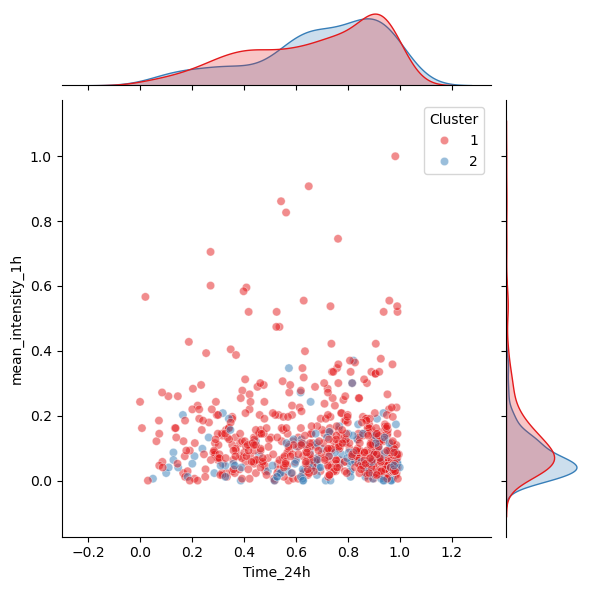

Plotting Time_24h vs hungry


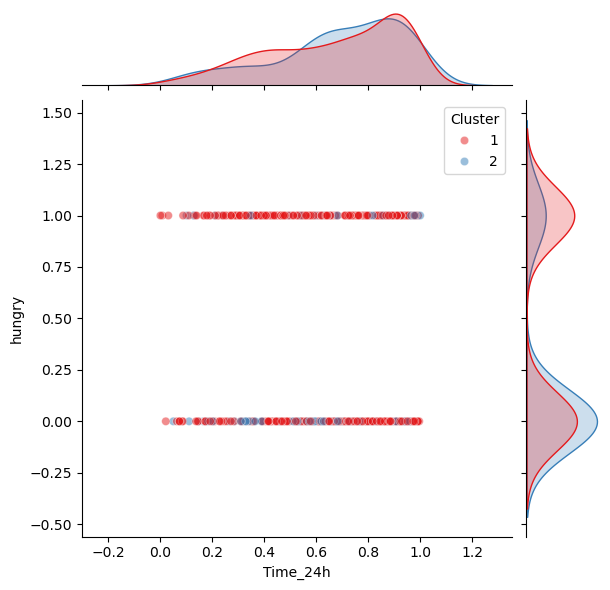

Plotting Time_24h vs Z_Previous_4


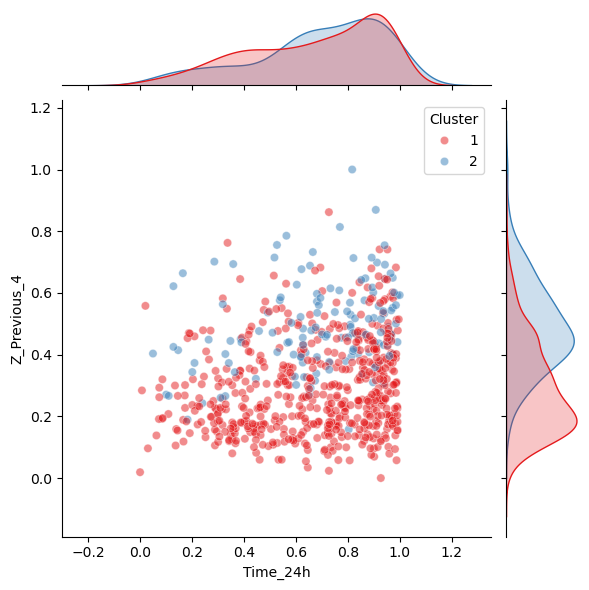

Plotting Time_24h vs 15m_G_Diff_7


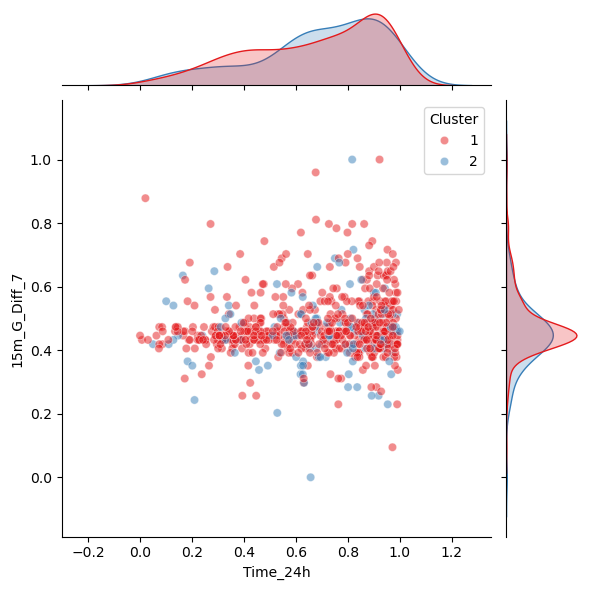

Plotting mean_intensity_1h vs hungry


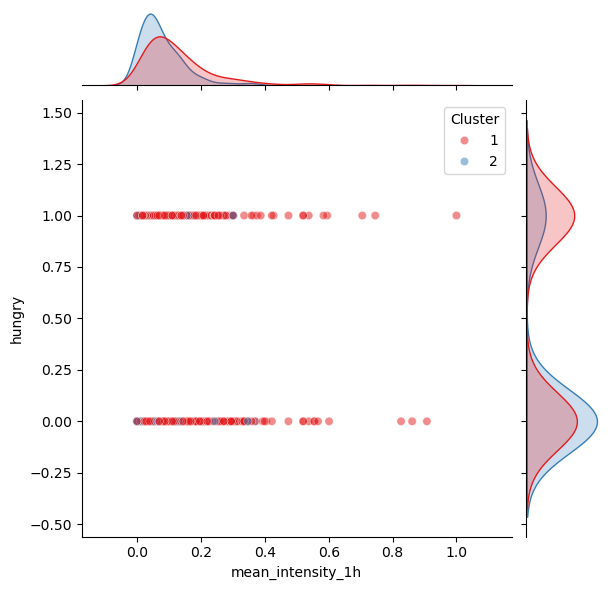

Plotting mean_intensity_1h vs Z_Previous_4


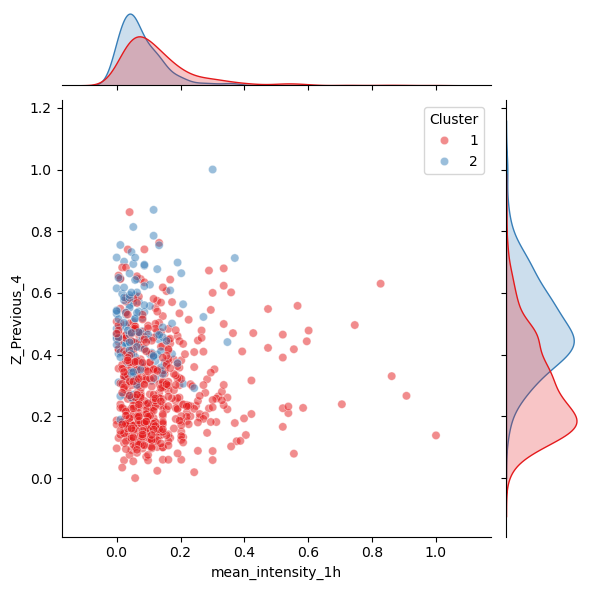

Plotting mean_intensity_1h vs 15m_G_Diff_7


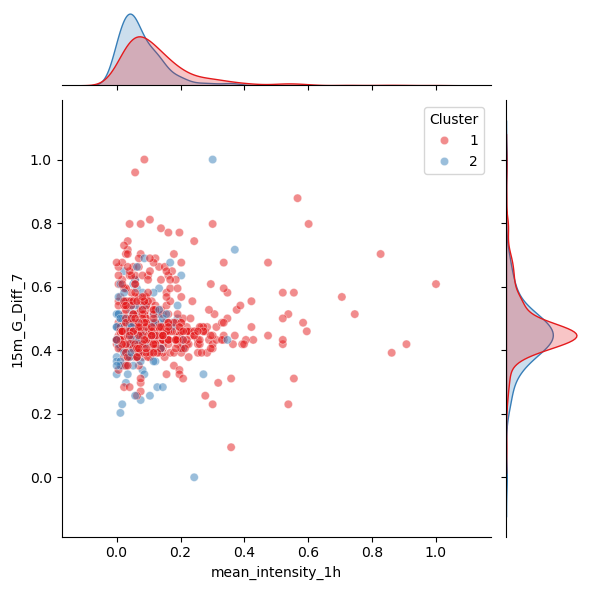

Plotting hungry vs Z_Previous_4


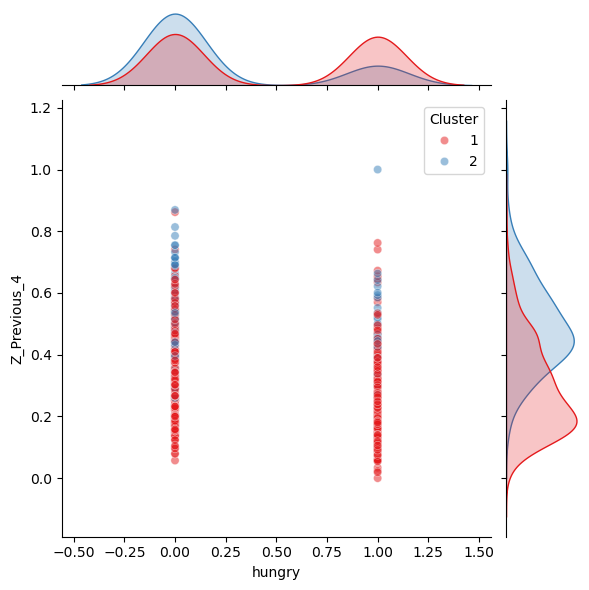

Plotting hungry vs 15m_G_Diff_7


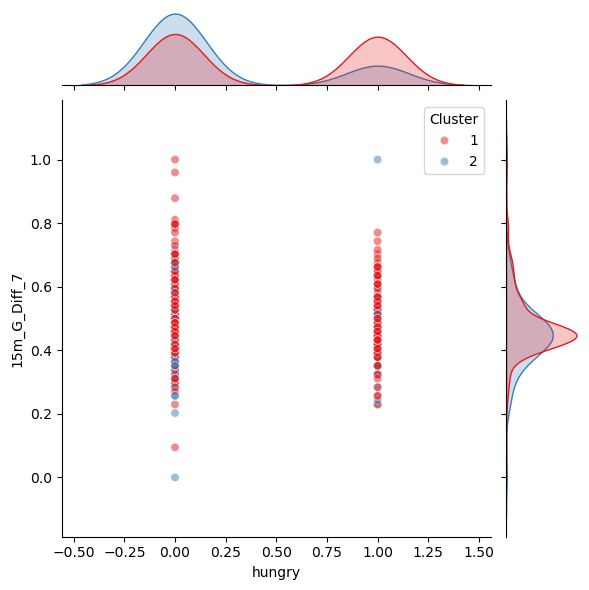

Plotting Z_Previous_4 vs 15m_G_Diff_7


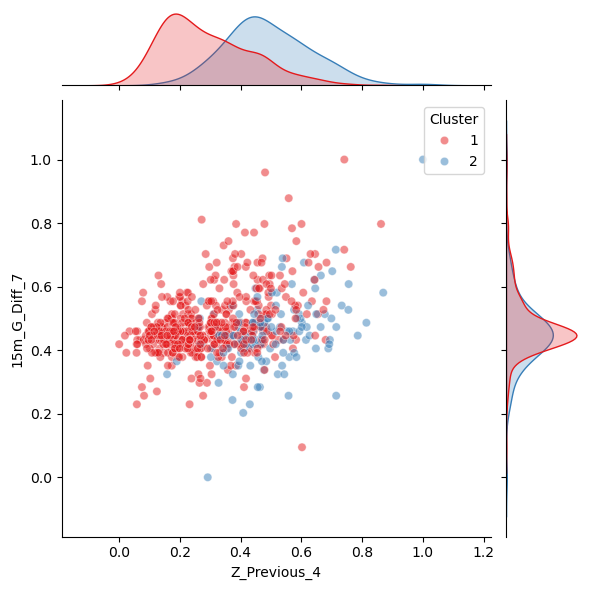


=== Cluster 2 ===
Plotting Z_Previous_4 vs Time_24h


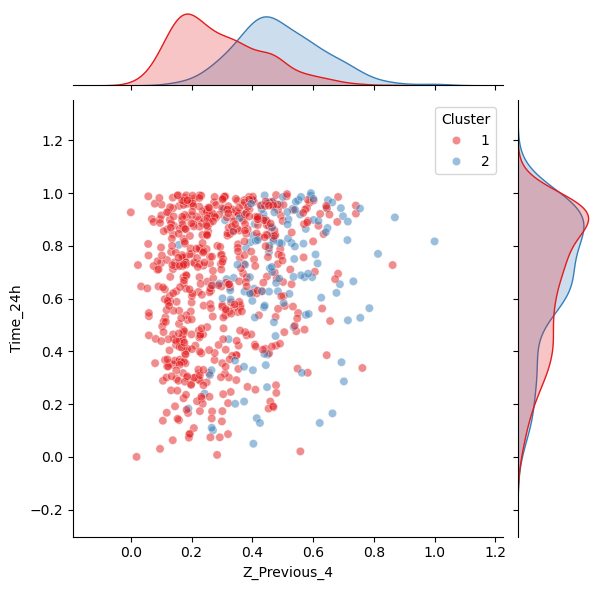

Plotting Z_Previous_4 vs mean_intensity_1h


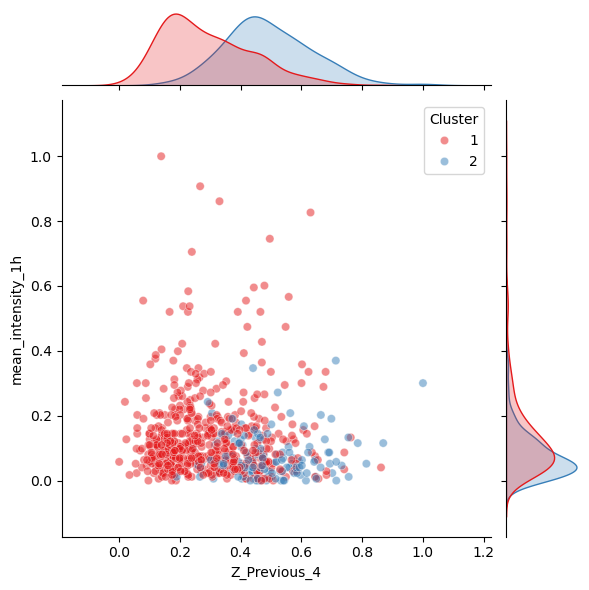

Plotting Z_Previous_4 vs G_minus_T_pre_2h


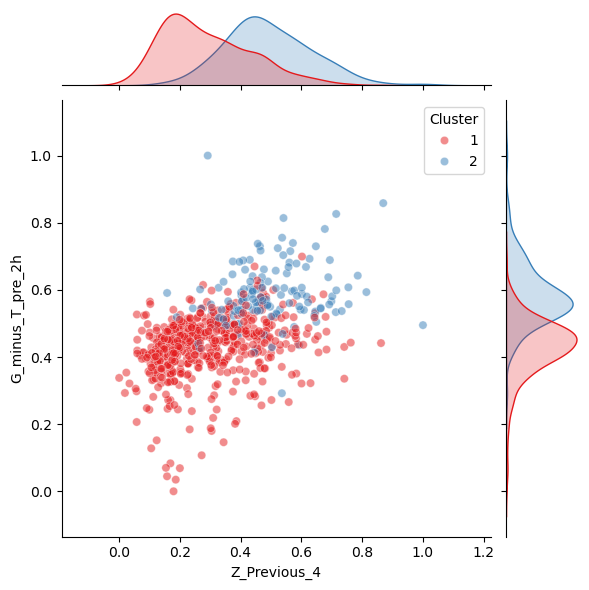

Plotting Z_Previous_4 vs G_minus_T_pre_1.5h


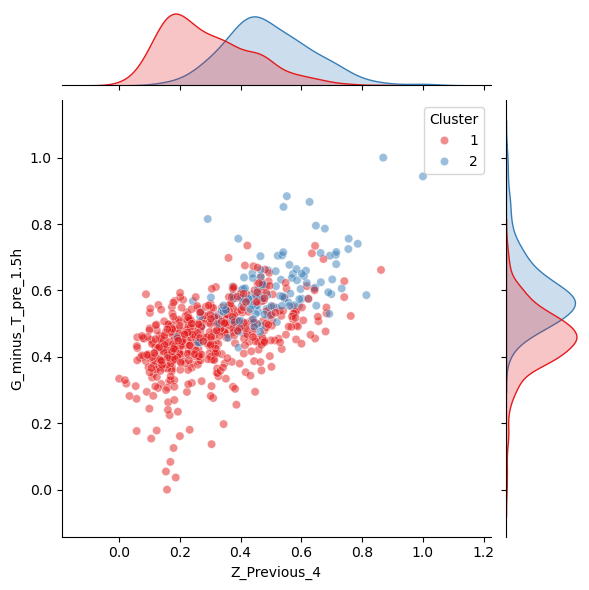

Plotting Time_24h vs mean_intensity_1h


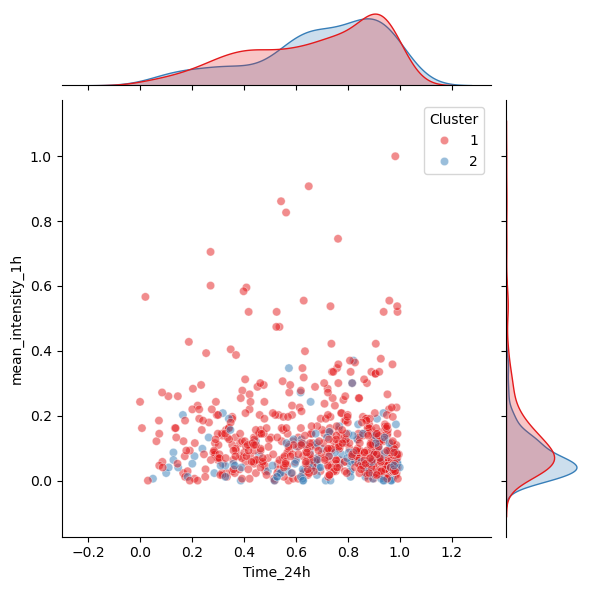

Plotting Time_24h vs G_minus_T_pre_2h


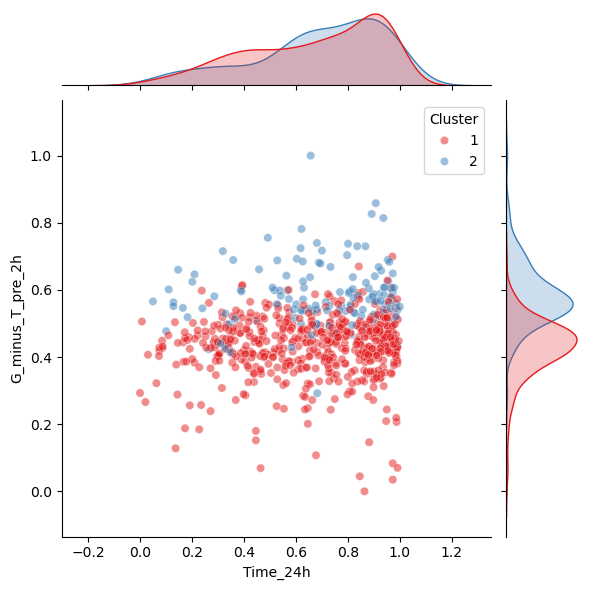

Plotting Time_24h vs G_minus_T_pre_1.5h


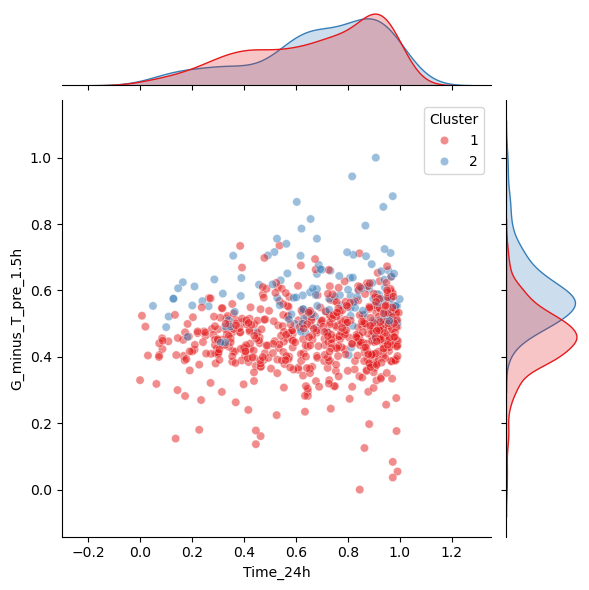

Plotting mean_intensity_1h vs G_minus_T_pre_2h


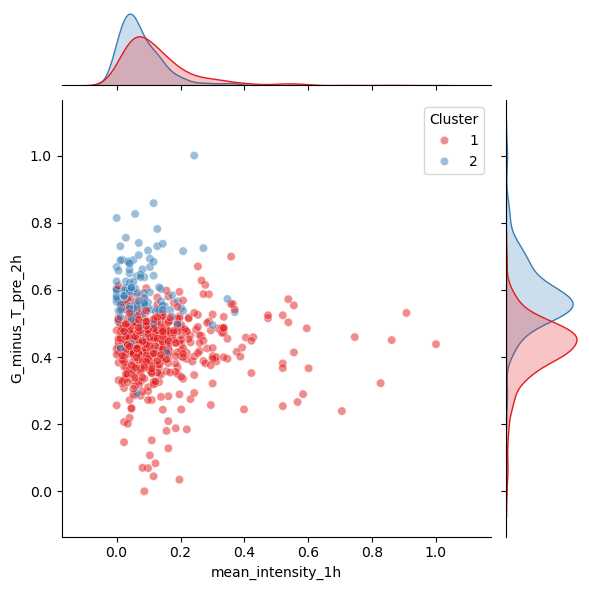

Plotting mean_intensity_1h vs G_minus_T_pre_1.5h


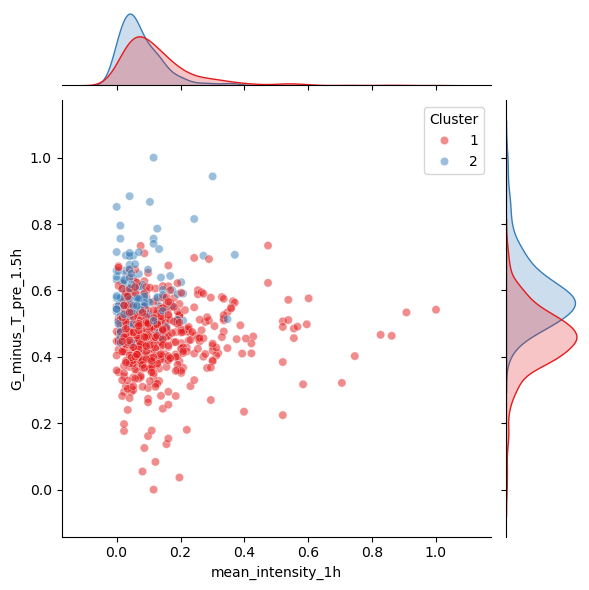

Plotting G_minus_T_pre_2h vs G_minus_T_pre_1.5h


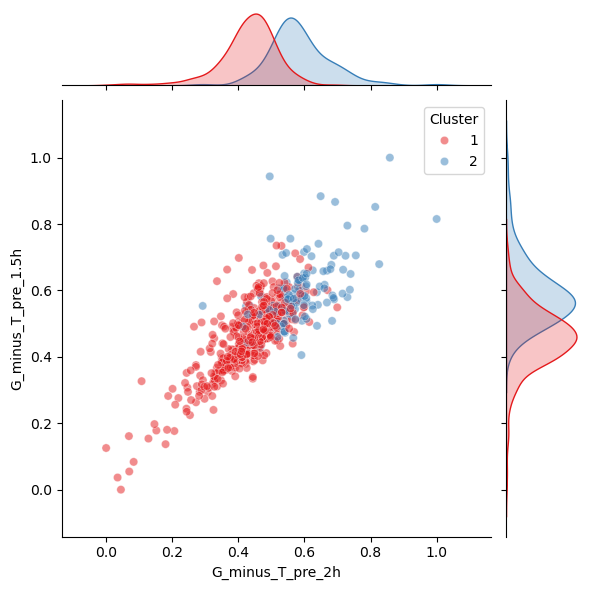

In [129]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
from sklearn.preprocessing import MinMaxScaler

# === 1) MinMaxScaler로 0–1 변환 ===
scaler = MinMaxScaler()
X_scaled_01 = scaler.fit_transform(X_raw)  # 원본 값 → 0–1 범위로 변환
df_plot_scaled = pd.DataFrame(X_scaled_01, columns=FEATURES, index=X_with_cluster.index)

# === 2) 클러스터 라벨 붙이기 ===
df_plot_scaled["Cluster"] = X_with_cluster["Cluster"]

# === 3) SHAP 값 DataFrame 준비 ===
shap_df = pd.DataFrame(shap_pos_clipped, columns=FEATURES, index=X_with_cluster.index)
shap_df["Cluster"] = X_with_cluster["Cluster"]

# === 4) 클러스터별 평균 SHAP 기반 Top5 features 뽑기 ===
cluster_means = shap_df.groupby("Cluster").mean()
top_feats = {
    clust: cluster_means.loc[clust].sort_values(ascending=False).head(5).index.tolist()
    for clust in cluster_means.index if clust in [1,2]  # Cluster 3 제외
}

print("=== Top5 features per cluster (from SHAP) ===")
for clust, feats in top_feats.items():
    print(f"Cluster {clust}: {feats}")

# === 5) Cluster 1,2 데이터만 준비 ===
df_plot_scaled = df_plot_scaled[df_plot_scaled["Cluster"].isin([1,2])]

# === 6) 각 클러스터별 Top5 feature 조합 시각화 ===
for clust, feats in top_feats.items():
    print(f"\n=== Cluster {clust} ===")
    for f1, f2 in itertools.combinations(feats, 2):
        print(f"Plotting {f1} vs {f2}")
        sns.jointplot(
            data=df_plot_scaled,
            x=f1, y=f2,
            hue="Cluster",
            marginal_kws=dict(common_norm=False, fill=True),  # KDE 옵션 전달
            palette="Set1",
            alpha=0.5
        )
        plt.show()


## Z_Previous_4, G_minus_T_pre_2h, G_minus_T_pre_1.5h, Hungry show the most distinct distributions

# Pairwise scatter plot

/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


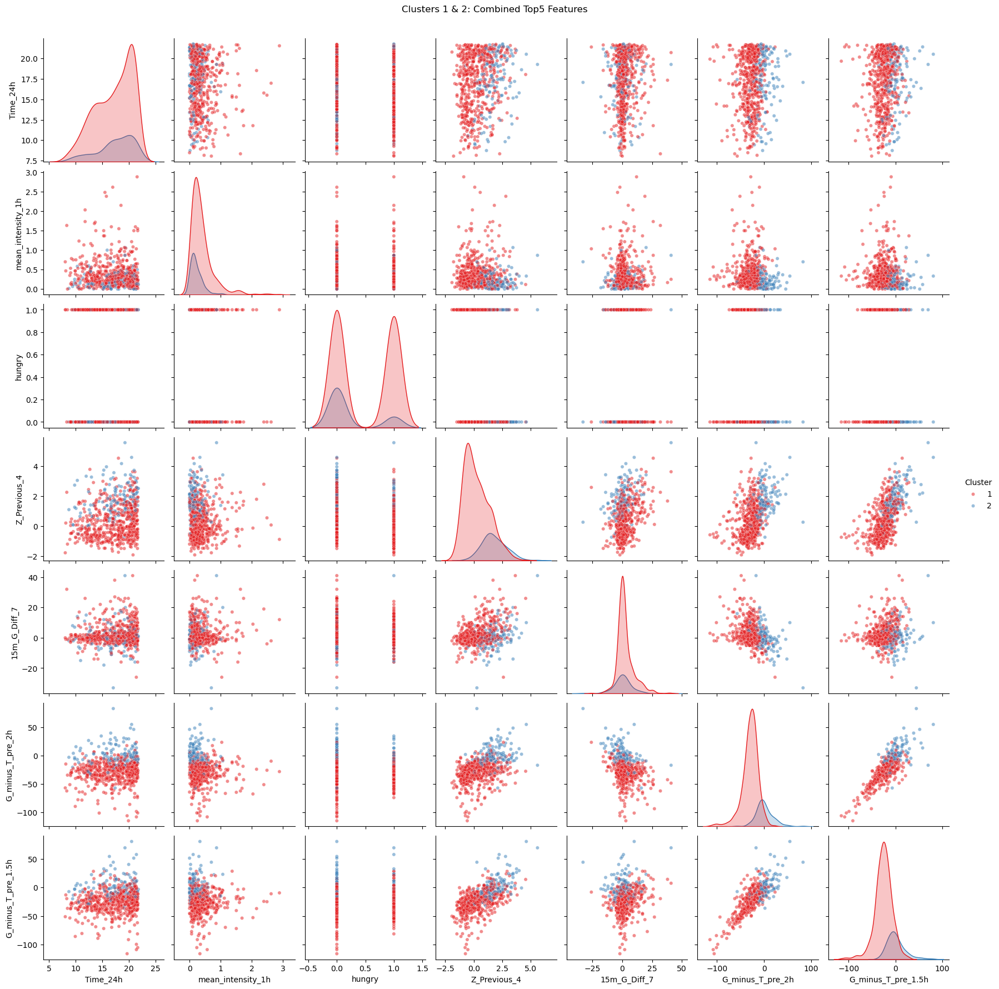

In [21]:
# === Cluster 1,2 데이터만 준비 ===
df_plot = X_with_cluster[X_with_cluster["Cluster"].isin([1,2])]

# === Cluster 1+2 Top5 합집합 ===
combined_feats = [
    'Time_24h', 'mean_intensity_1h', 'hungry', 
    'Z_Previous_4', '15m_G_Diff_7', 
    'G_minus_T_pre_2h', 'G_minus_T_pre_1.5h'
]

# === pairplot ===
sns.pairplot(
    data=df_plot,
    vars=combined_feats,
    hue="Cluster",
    palette="Set1",
    plot_kws={"alpha": 0.5, "s": 20}
)
plt.suptitle("Clusters 1 & 2: Combined Top5 Features", y=1.02)
plt.show()


# How Stress

/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


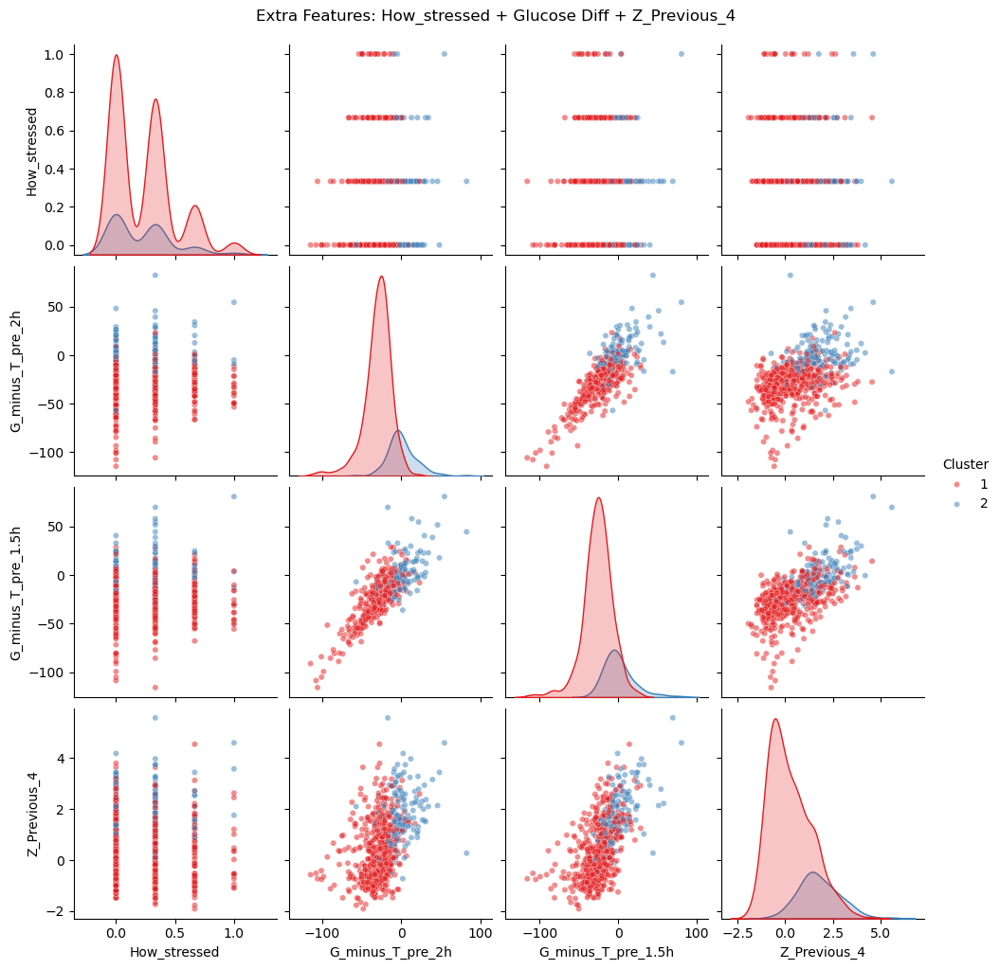

In [14]:
# === Stress ===
extra_feats = ["How_stressed", "G_minus_T_pre_2h", "G_minus_T_pre_1.5h", "Z_Previous_4"]

sns.pairplot(
    data=df_plot,
    vars=extra_feats,
    hue="Cluster",
    palette="Set1",
    plot_kws={"alpha": 0.5, "s": 20}
)
plt.suptitle("Extra Features: How_stressed + Glucose Diff + Z_Previous_4", y=1.02)
plt.show()


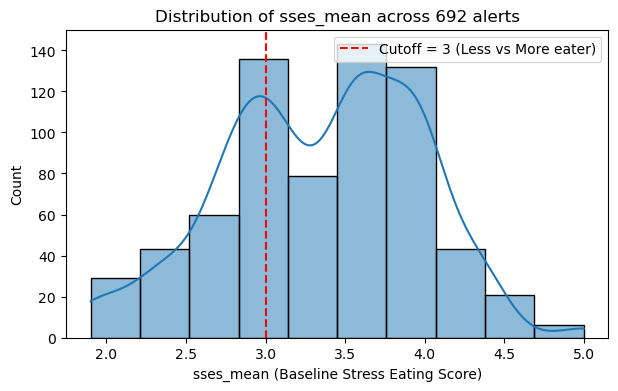

=== Group counts (692 alerts) ===
sses_group
More eater    450
Less eater    242
Name: count, dtype: int64

=== Group ratio (692 alerts) ===
sses_group
More eater    0.650289
Less eater    0.349711
Name: proportion, dtype: float64


In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

# === 1) sses_mean 분포 확인 ===
plt.figure(figsize=(7,4))
sns.histplot(alerts_with_sses["sses_mean"].dropna(), bins=10, kde=True)
plt.axvline(3, color="red", linestyle="--", label="Cutoff = 3 (Less vs More eater)")
plt.title("Distribution of sses_mean across 692 alerts")
plt.xlabel("sses_mean (Baseline Stress Eating Score)")
plt.ylabel("Count")
plt.legend()
plt.show()

# === 2) 이터 그룹 분류 ===
alerts_with_sses["sses_group"] = alerts_with_sses["sses_mean"].apply(
    lambda x: "Less eater" if x <= 3 else "More eater"
)

# === 3) 비율 확인 ===
group_counts = alerts_with_sses["sses_group"].value_counts()
group_ratio = alerts_with_sses["sses_group"].value_counts(normalize=True)

print("=== Group counts (692 alerts) ===")
print(group_counts)
print("\n=== Group ratio (692 alerts) ===")
print(group_ratio)


# TOP 3 Combination

In [24]:
from collections import Counter
import numpy as np

# 1) 각 샘플별로 SHAP top3 feature index 추출
top3_combos = []
for i in range(shap_pos_clipped.shape[0]):
    # row별 SHAP 값
    row_vals = shap_pos_clipped[i, :]
    
    # top3 index (값 큰 순서)
    top_idx = np.argsort(-row_vals)[:3]
    
    # feature 이름으로 변환
    top_feats = [FEATURES[j] for j in top_idx]
    
    # 조합을 tuple로 (정렬해서 순서 무관하게)
    combo = tuple(sorted(top_feats))
    top3_combos.append(combo)

# 2) 빈도수 집계
combo_counts = Counter(top3_combos)

# 3) 상위 3개 조합 출력
print("\n=== Top 3 most frequent top3-feature combinations (692 alerts) ===")
for combo, count in combo_counts.most_common(10):
    print(f"{combo}: {count} times ({count/692:.2%})")



=== Top 3 most frequent top3-feature combinations (692 alerts) ===
('Time_24h', 'hungry', 'mean_intensity_1h'): 119 times (17.20%)
('Time_24h', 'Z_Previous_4', 'mean_intensity_1h'): 102 times (14.74%)
('Time_24h', 'Z_HR', 'mean_intensity_1h'): 47 times (6.79%)
('15m_G_Diff_7', 'Time_24h', 'mean_intensity_1h'): 42 times (6.07%)
('How_stressed', 'Time_24h', 'mean_intensity_1h'): 41 times (5.92%)
('15m_G_Diff_5', 'Time_24h', 'mean_intensity_1h'): 26 times (3.76%)
('EMA_T_Diff', 'Time_24h', 'mean_intensity_1h'): 24 times (3.47%)
('Time_24h', 'mean_intensity_1h', 'mean_intensity_2h'): 24 times (3.47%)
('G_minus_T_pre_2h', 'Time_24h', 'Z_Previous_4'): 22 times (3.18%)
('Intensity', 'TimeInBed', 'mean_intensity_1h'): 19 times (2.75%)



=== Pairplot for combo: ['Time_24h', 'hungry', 'mean_intensity_1h'] ===


/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


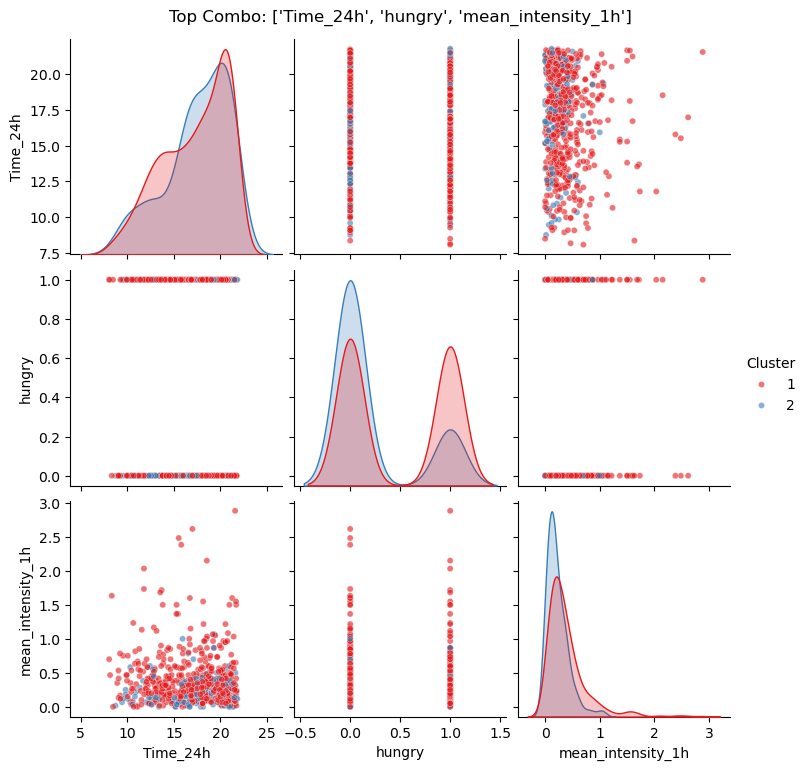


=== Pairplot for combo: ['Time_24h', 'Z_Previous_4', 'mean_intensity_1h'] ===


/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


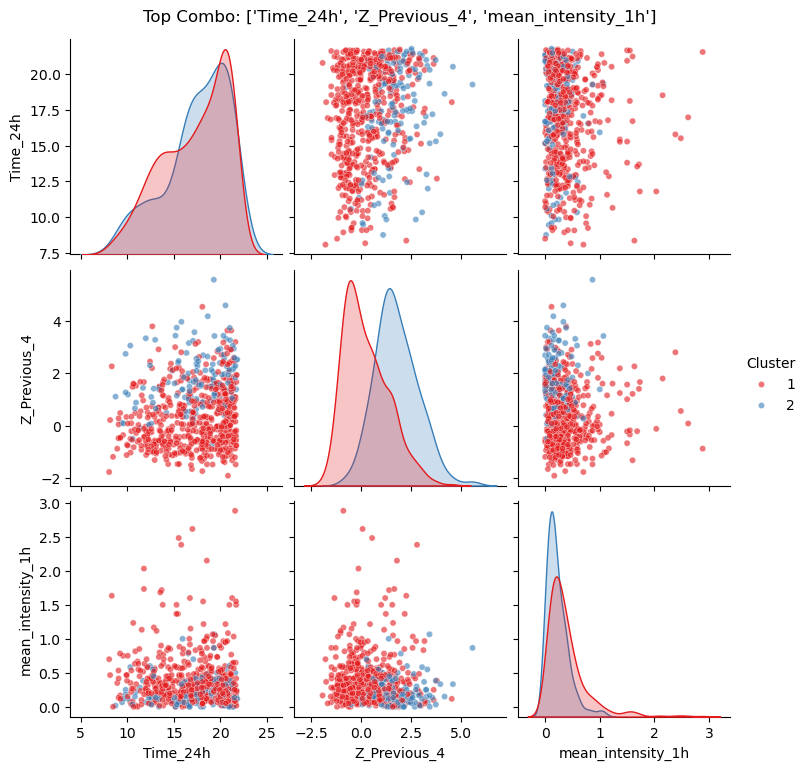


=== Pairplot for combo: ['Time_24h', 'Z_HR', 'mean_intensity_1h'] ===


/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


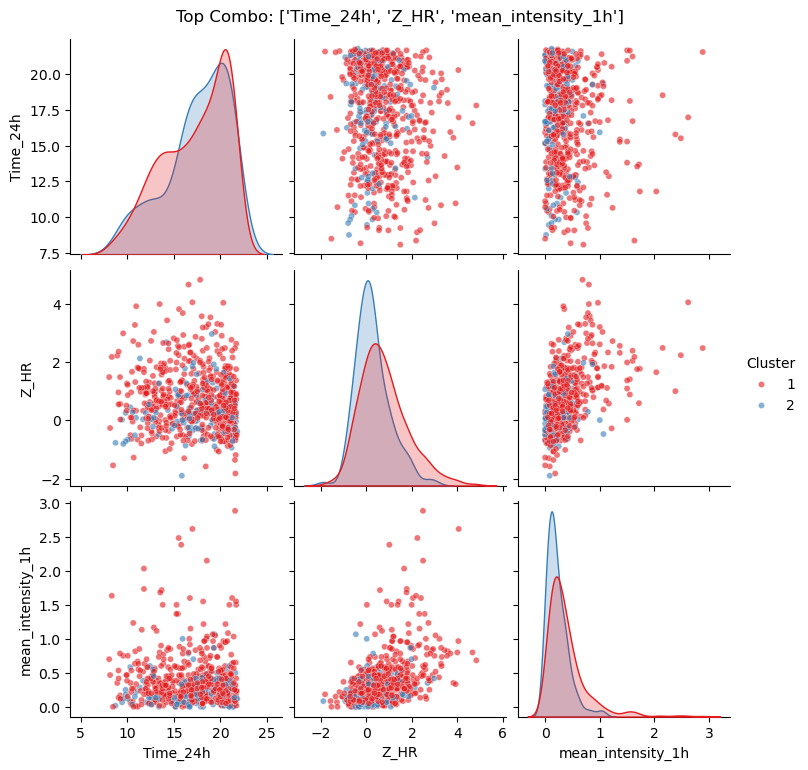


=== Pairplot for combo: ['15m_G_Diff_7', 'Time_24h', 'mean_intensity_1h'] ===


/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


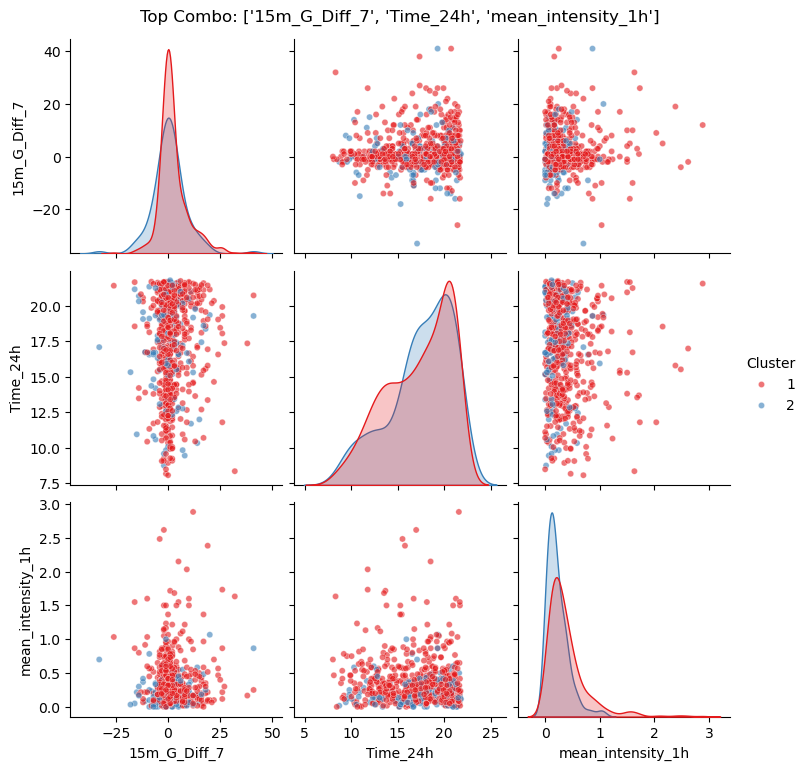


=== Pairplot for combo: ['How_stressed', 'Time_24h', 'mean_intensity_1h'] ===


/opt/anaconda3/envs/jupyter_env/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


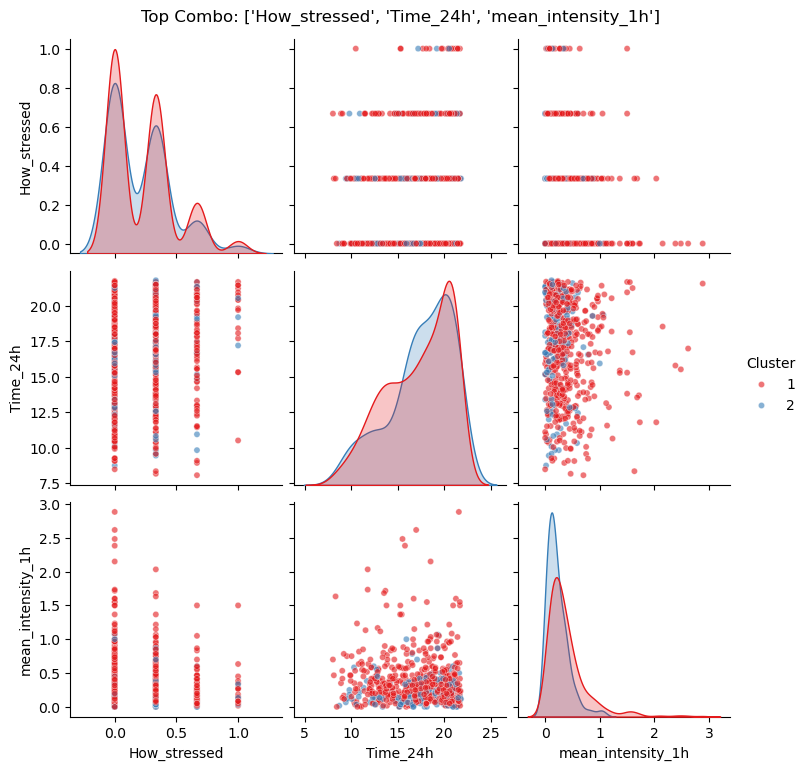

In [139]:
import seaborn as sns
import matplotlib.pyplot as plt

# Top 5 most frequent combos (each has 3 features)
top_combos = [
    ('Time_24h', 'hungry', 'mean_intensity_1h'),
    ('Time_24h', 'Z_Previous_4', 'mean_intensity_1h'),
    ('Time_24h', 'Z_HR', 'mean_intensity_1h'),
    ('15m_G_Diff_7', 'Time_24h', 'mean_intensity_1h'),
    ('How_stressed', 'Time_24h', 'mean_intensity_1h')
]

# Generate pairplots for each combo
for combo in top_combos:
    feats = list(combo)
    print(f"\n=== Pairplot for combo: {feats} ===")
    
    g = sns.pairplot(
        data=df_plot,          # Data with cluster labels
        vars=feats,            # Features for this combo
        hue="Cluster",         # Color by cluster
        palette="Set1",
        diag_kind="kde",       # kde → cluster별 색깔로 그려짐
        diag_kws={"common_norm": False, "fill": True},  # 그룹별 정규화X, 색깔 채우기
        plot_kws={"alpha":0.6, "s":20}
    )
    
    g.fig.suptitle(f"Top Combo: {feats}", y=1.02)
    plt.show()


## The combination of Time_24h, hungry, and mean_intensity_1h appeared most frequently because these variables often had strong positive SHAP contributions. In other words, the model frequently relied on time of day, hunger status, and recent activity intensity as important contextual cues for prediction.

## However, these variables do not separate clusters well since their distributions are fairly similar across all samples.

## In contrast, variables such as Z_Previous_4, G_minus_T_pre_1.5h, and G_minus_T_pre_2h show distributional differences between groups. These glucose-related markers are continuous measures of physiological state, which makes them more effective for clustering.

## In summary: SHAP top features (time, hunger, activity) are best used for real-time triggers, while glucose-pattern variables are more useful for group segmentation.

# Increase Cluster

       2      3      4      5      6      7      8      9      10
1   557.0  557.0  174.0  174.0  174.0  101.0  101.0  101.0   59.0
2   135.0  134.0  383.0  305.0  305.0   73.0   73.0   12.0   42.0
3     NaN    1.0  134.0   78.0   78.0  305.0  305.0   61.0   12.0
4     NaN    NaN    1.0  134.0   21.0   78.0   29.0  305.0   61.0
5     NaN    NaN    NaN    1.0  113.0   21.0   49.0   29.0  305.0
6     NaN    NaN    NaN    NaN    1.0  113.0   21.0   49.0   29.0
7     NaN    NaN    NaN    NaN    NaN    1.0  113.0   21.0   49.0
8     NaN    NaN    NaN    NaN    NaN    NaN    1.0  113.0   21.0
9     NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0  113.0
10    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    1.0


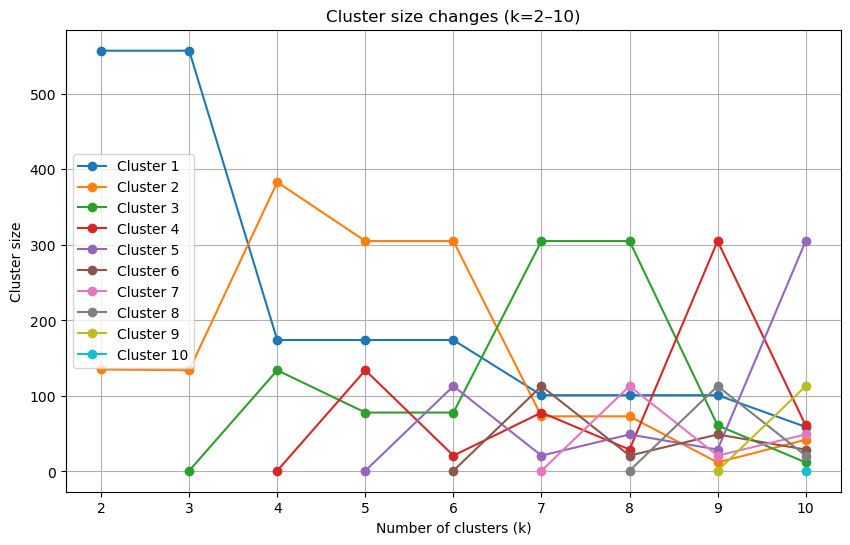

In [148]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster

# linkage 계산 (ward 기준)
Z = linkage(X_scaled, method="ward")

# 클러스터 개수별 분포 저장
cluster_distributions = {}

for k in range(2, 11):
    clusters = fcluster(Z, t=k, criterion="maxclust")
    unique, counts = np.unique(clusters, return_counts=True)
    cluster_distributions[k] = dict(zip(unique, counts))

# DataFrame 변환
df_counts = pd.DataFrame.from_dict(cluster_distributions, orient="index").T
df_counts = df_counts.astype(float)   # 숫자+NaN을 float으로 변환

print(df_counts)

# 시각화
plt.figure(figsize=(10, 6))
for cluster_id in df_counts.index:
    plt.plot(df_counts.columns, df_counts.loc[cluster_id], marker="o", label=f"Cluster {cluster_id}")

plt.title("Cluster size changes (k=2–10)")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Cluster size")
plt.legend()
plt.grid(True)
plt.show()


## Using more than 5 clusters, too many small groups appear
## Set k=4, excluded the single outlier, and used the remaining 3 groups

# Clustering(k=4)

In [153]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster

# === 1) linkage 계산 (ward) ===
Z = linkage(X_scaled, method="ward")

# === 2) k=4 클러스터링 ===
clusters = fcluster(Z, t=4, criterion="maxclust")

# === 3) 클러스터 결과 붙이기 ===
X_with_cluster = X_raw.copy()
X_with_cluster["Cluster"] = clusters

# === 4) SHAP 값 DataFrame 준비 ===
shap_df = pd.DataFrame(shap_pos_clipped, columns=FEATURES, index=X_with_cluster.index)
shap_df["Cluster"] = clusters

# === 5) 클러스터별 평균 SHAP 계산 ===
cluster_means = shap_df.groupby("Cluster").mean()

# === 6) 각 클러스터별 Top 5 SHAP features 뽑기 (outlier 제외) ===
for clust in sorted(cluster_means.index):
    if (X_with_cluster["Cluster"] == clust).sum() <= 1:
        print(f"Cluster {clust} is an outlier and excluded.")
        continue
    top5 = cluster_means.loc[clust].sort_values(ascending=False).head(5)
    print(f"\n=== Cluster {clust} | Top 5 SHAP features ===")
    print(top5.round(6))



=== Cluster 1 | Top 5 SHAP features ===
Time_24h             0.033460
mean_intensity_1h    0.030458
Z_Previous_4         0.017492
15m_G_Diff_7         0.008400
15m_G_Diff_5         0.006966
Name: 1, dtype: float64

=== Cluster 2 | Top 5 SHAP features ===
Time_24h             0.036893
mean_intensity_1h    0.034244
hungry               0.011740
How_stressed         0.006842
15m_G_Diff_7         0.005721
Name: 2, dtype: float64

=== Cluster 3 | Top 5 SHAP features ===
Z_Previous_4          0.033562
Time_24h              0.028296
mean_intensity_1h     0.019686
G_minus_T_pre_2h      0.013046
G_minus_T_pre_1.5h    0.007544
Name: 3, dtype: float64
Cluster 4 is an outlier and excluded.


=== Top5 features per cluster (from SHAP) ===
Cluster 1: ['Time_24h', 'mean_intensity_1h', 'Z_Previous_4', '15m_G_Diff_7', '15m_G_Diff_5']
Cluster 2: ['Time_24h', 'mean_intensity_1h', 'hungry', 'How_stressed', '15m_G_Diff_7']
Cluster 3: ['Z_Previous_4', 'Time_24h', 'mean_intensity_1h', 'G_minus_T_pre_2h', 'G_minus_T_pre_1.5h']

=== Cluster 1 ===
Plotting Time_24h vs mean_intensity_1h


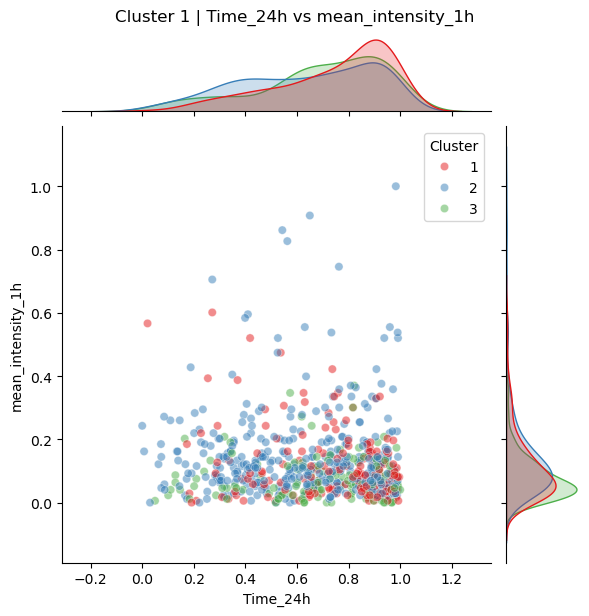

Plotting Time_24h vs Z_Previous_4


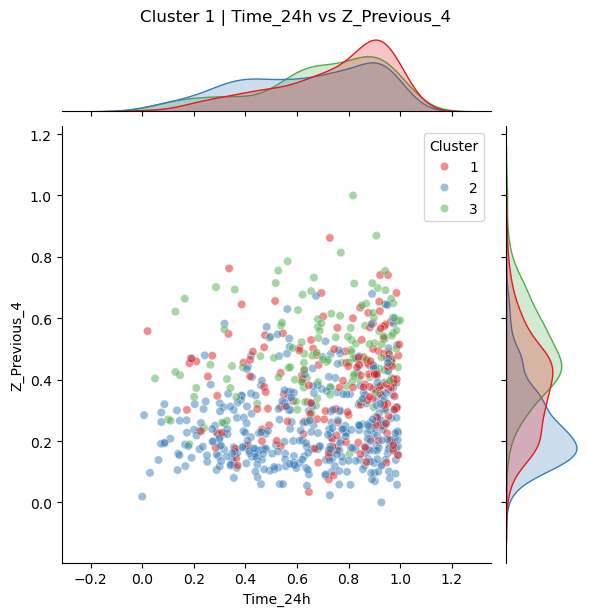

Plotting Time_24h vs 15m_G_Diff_7


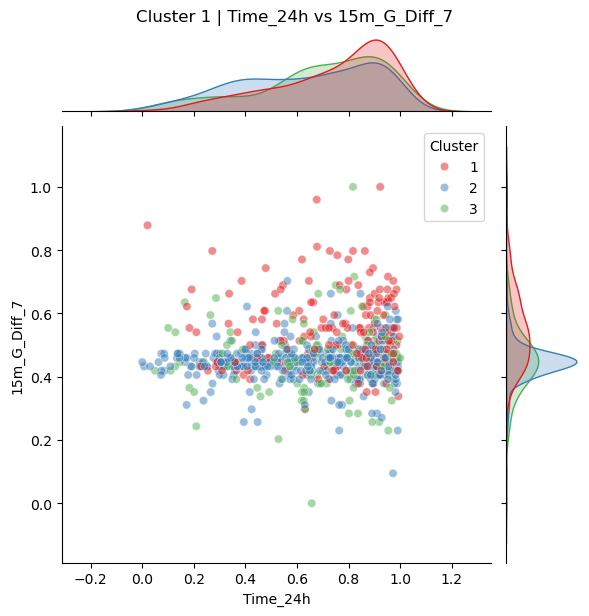

Plotting Time_24h vs 15m_G_Diff_5


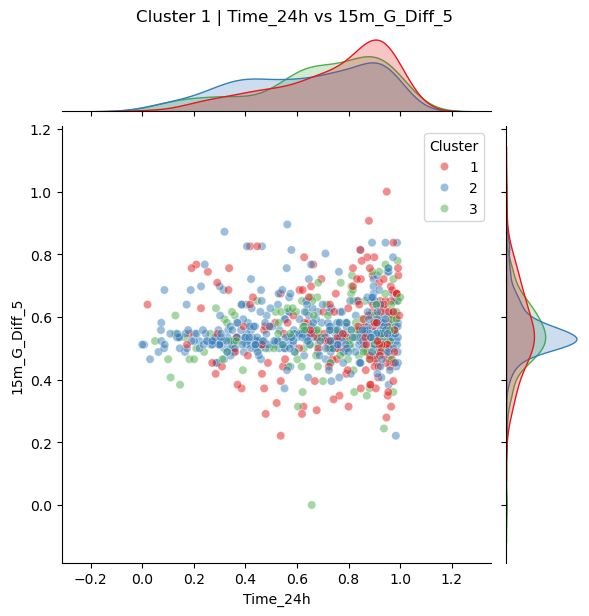

Plotting mean_intensity_1h vs Z_Previous_4


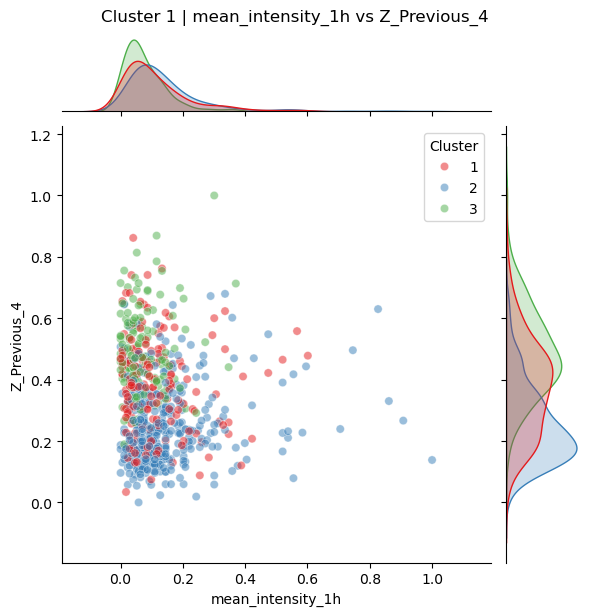

Plotting mean_intensity_1h vs 15m_G_Diff_7


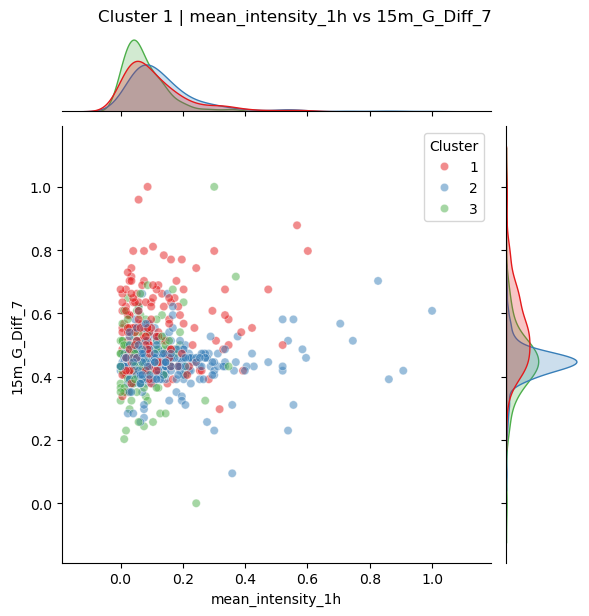

Plotting mean_intensity_1h vs 15m_G_Diff_5


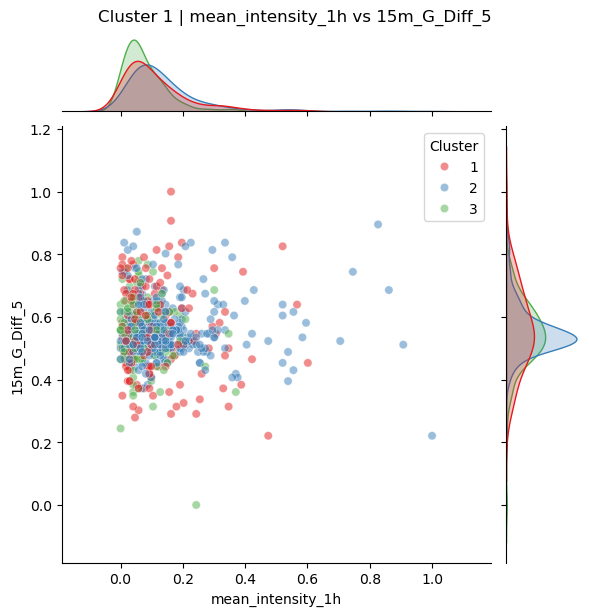

Plotting Z_Previous_4 vs 15m_G_Diff_7


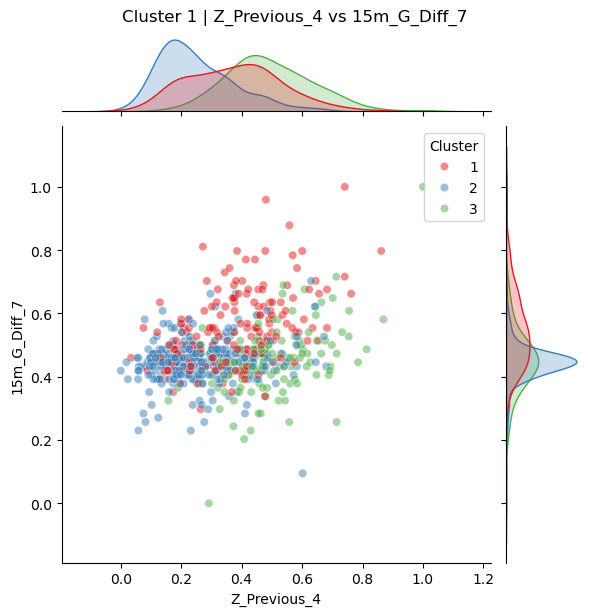

Plotting Z_Previous_4 vs 15m_G_Diff_5


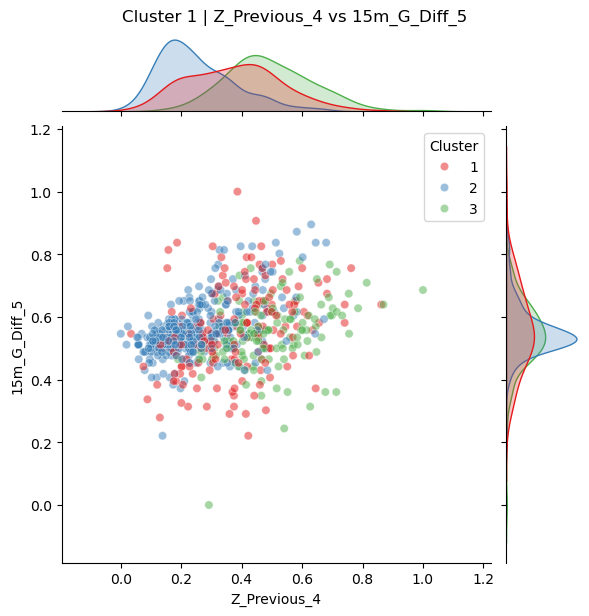

Plotting 15m_G_Diff_7 vs 15m_G_Diff_5


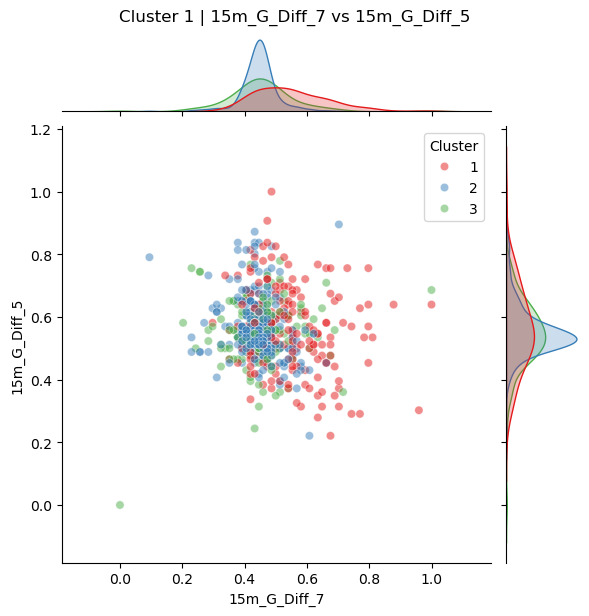


=== Cluster 2 ===
Plotting Time_24h vs mean_intensity_1h


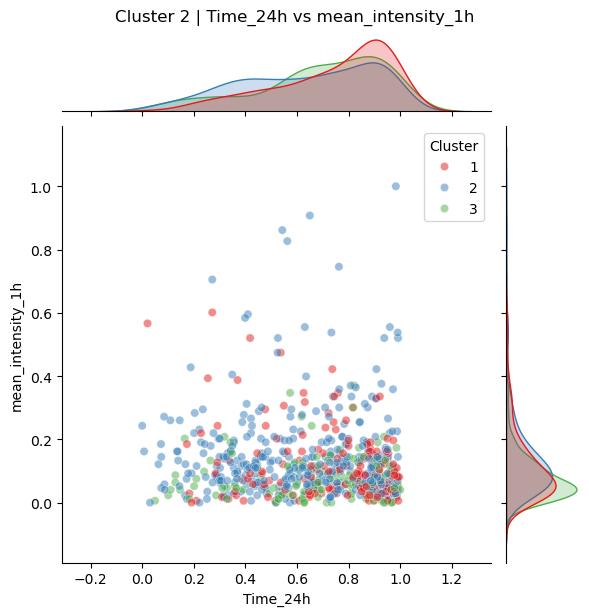

Plotting Time_24h vs hungry


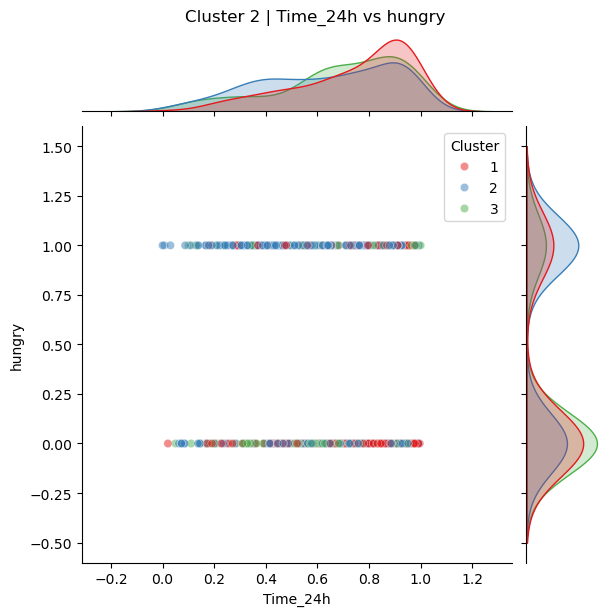

Plotting Time_24h vs How_stressed


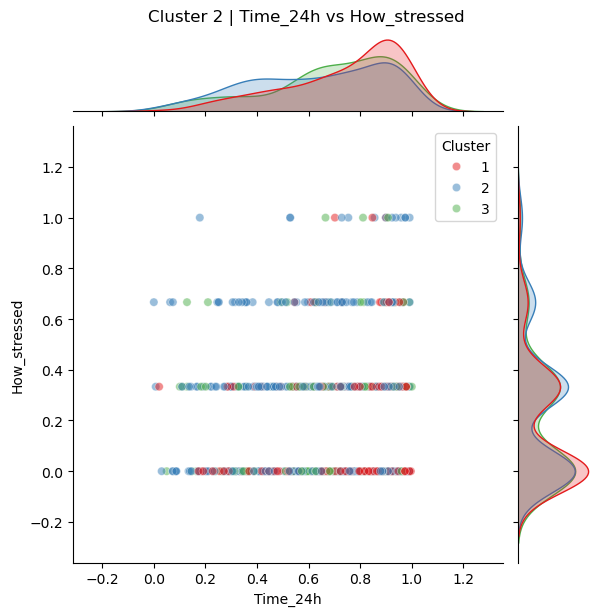

Plotting Time_24h vs 15m_G_Diff_7


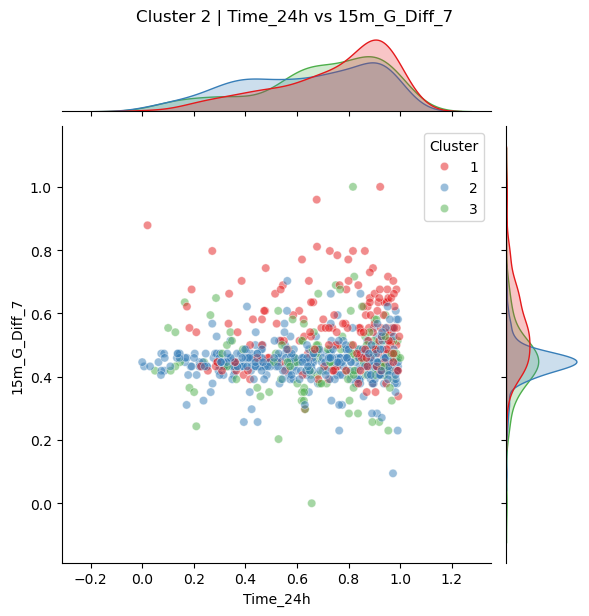

Plotting mean_intensity_1h vs hungry


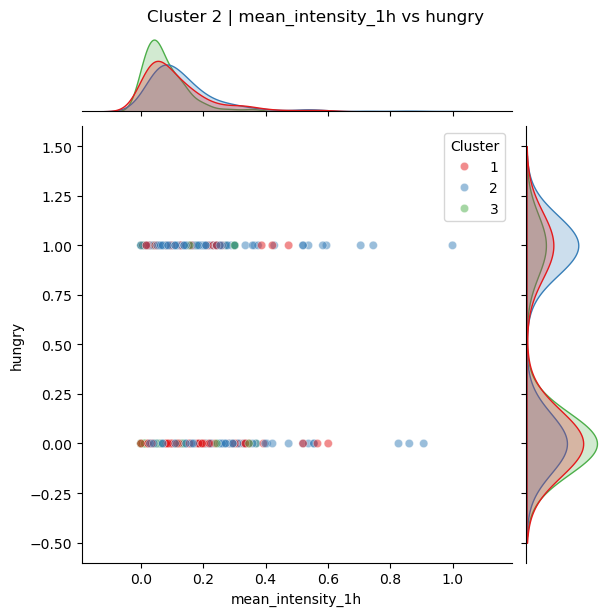

Plotting mean_intensity_1h vs How_stressed


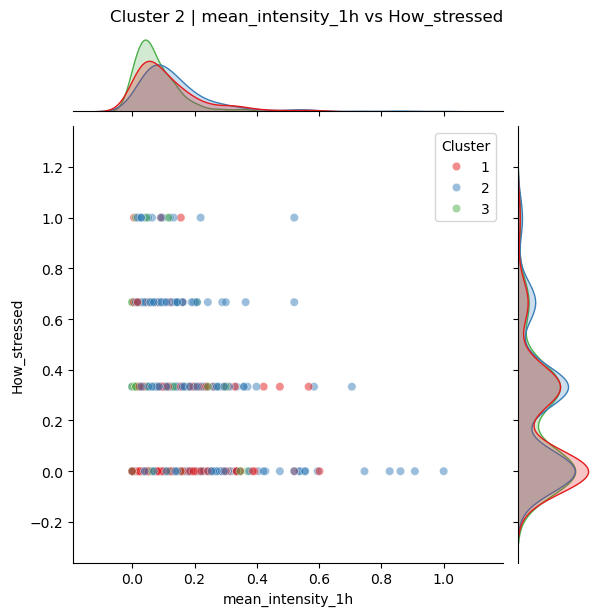

Plotting mean_intensity_1h vs 15m_G_Diff_7


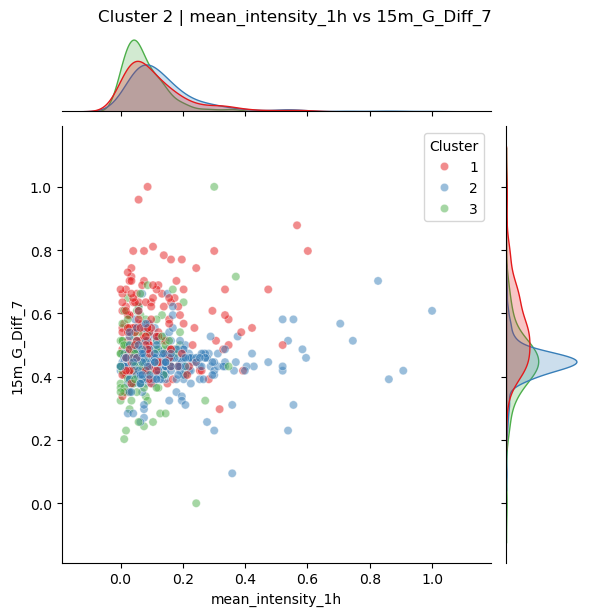

Plotting hungry vs How_stressed


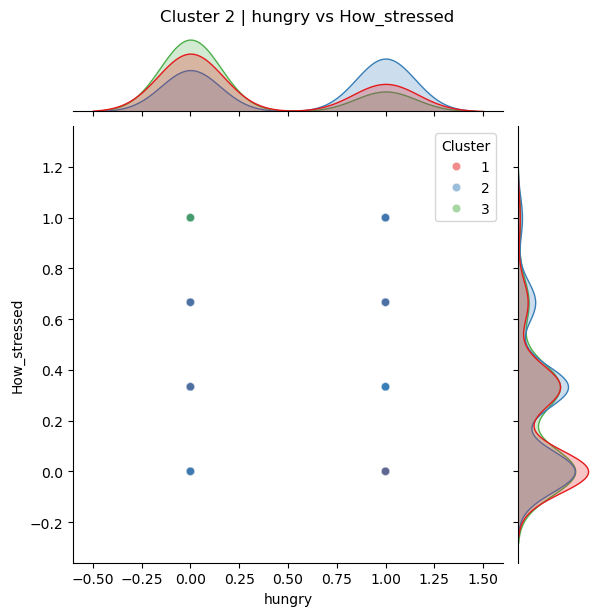

Plotting hungry vs 15m_G_Diff_7


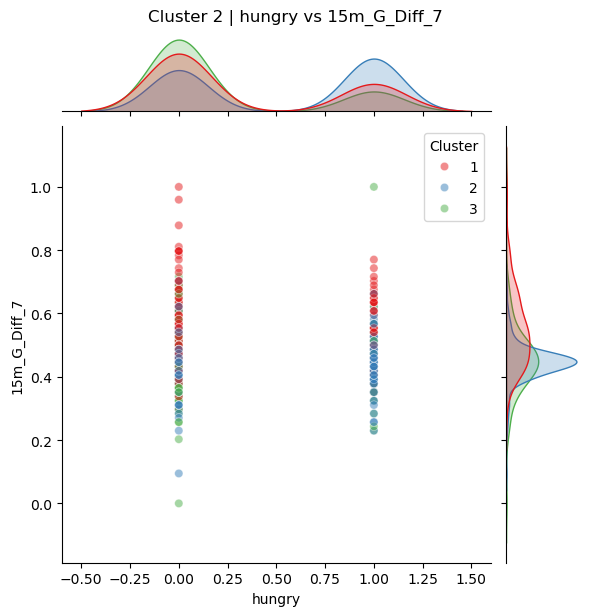

Plotting How_stressed vs 15m_G_Diff_7


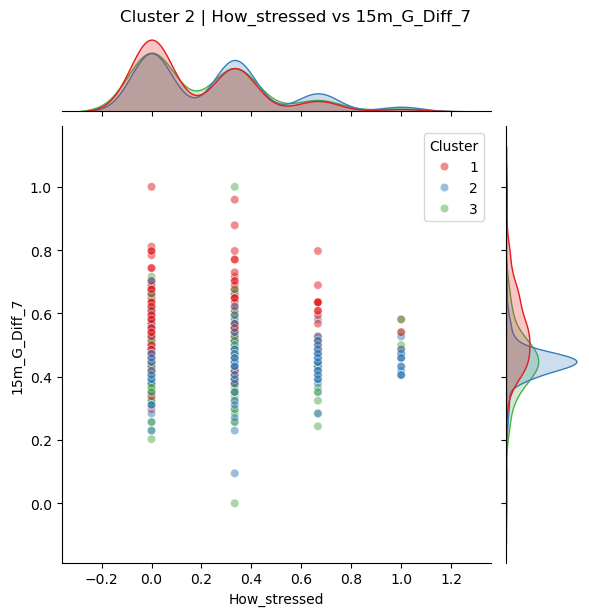


=== Cluster 3 ===
Plotting Z_Previous_4 vs Time_24h


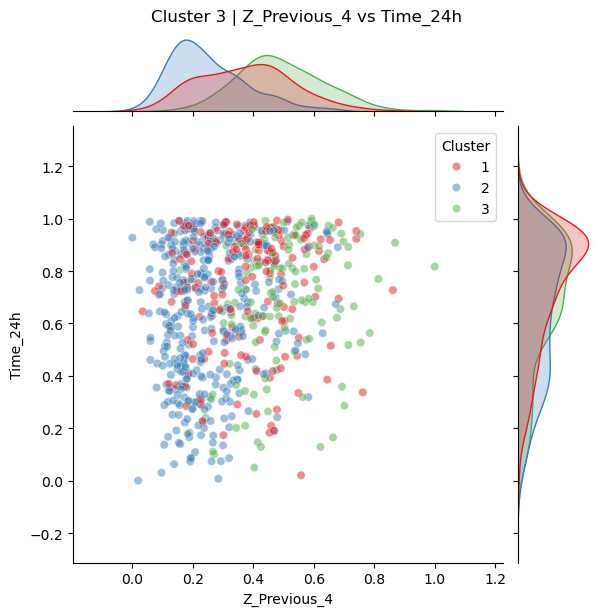

Plotting Z_Previous_4 vs mean_intensity_1h


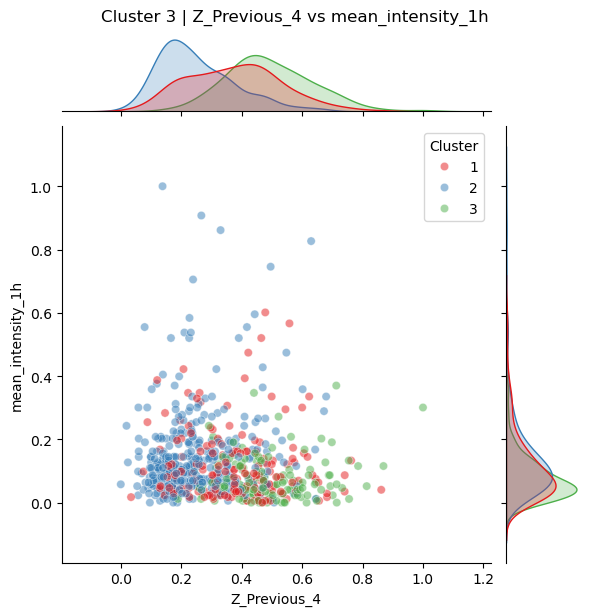

Plotting Z_Previous_4 vs G_minus_T_pre_2h


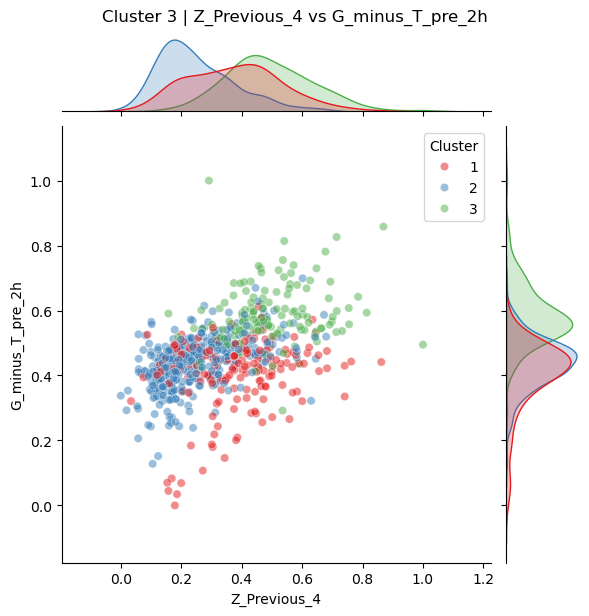

Plotting Z_Previous_4 vs G_minus_T_pre_1.5h


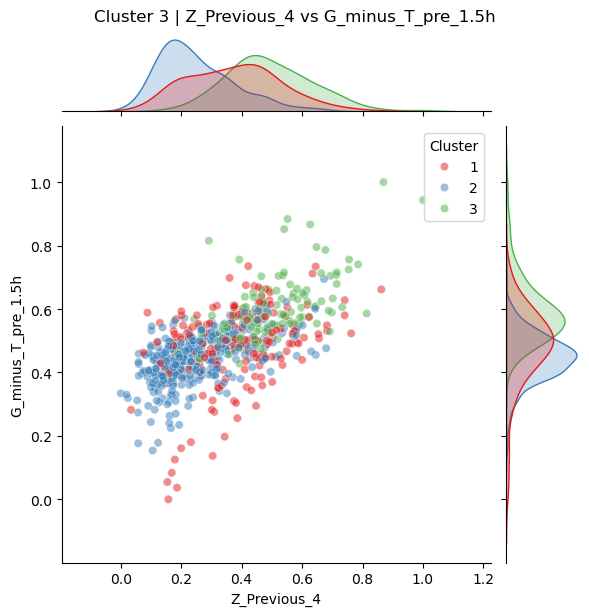

Plotting Time_24h vs mean_intensity_1h


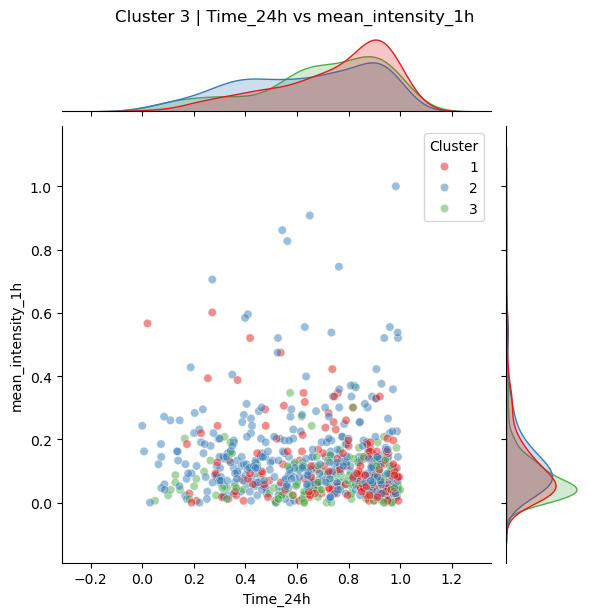

Plotting Time_24h vs G_minus_T_pre_2h


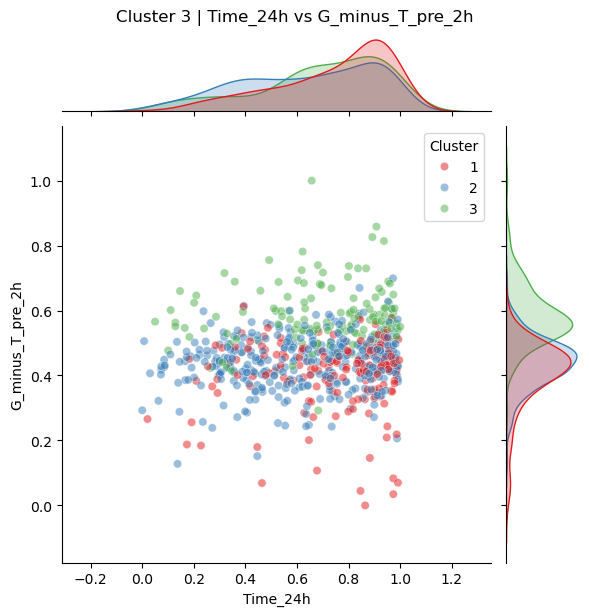

Plotting Time_24h vs G_minus_T_pre_1.5h


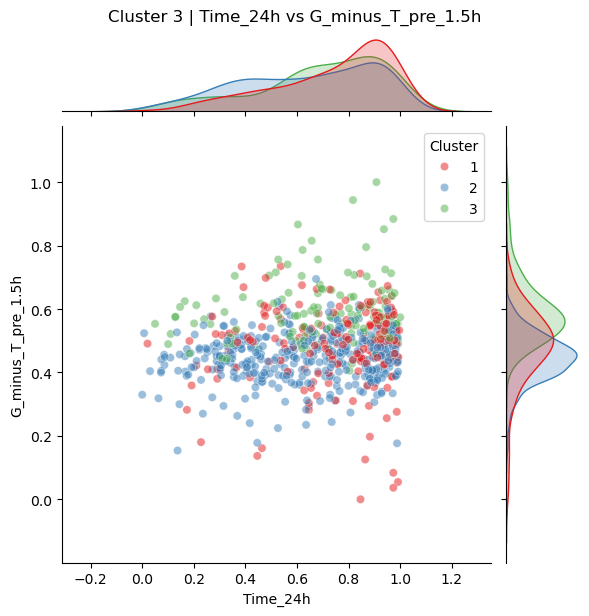

Plotting mean_intensity_1h vs G_minus_T_pre_2h


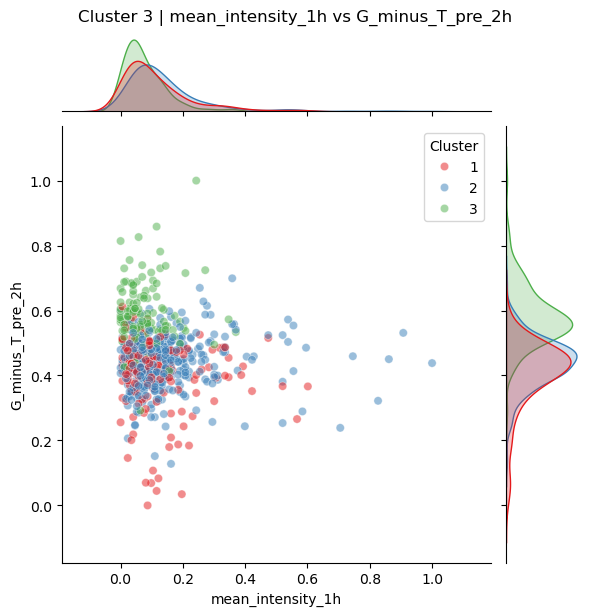

Plotting mean_intensity_1h vs G_minus_T_pre_1.5h


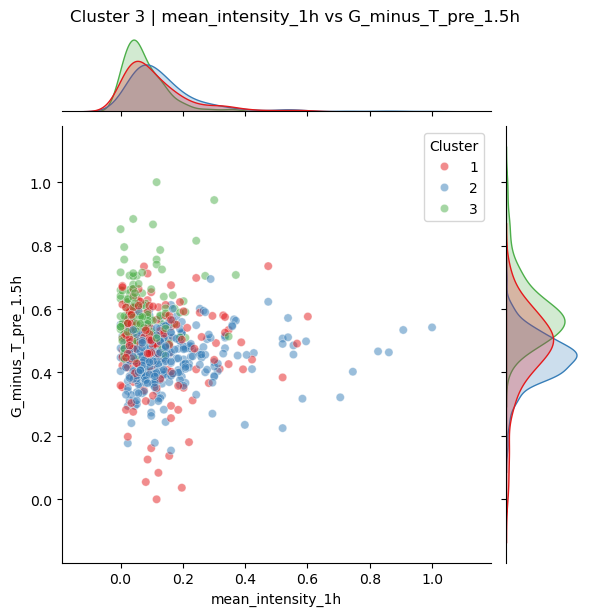

Plotting G_minus_T_pre_2h vs G_minus_T_pre_1.5h


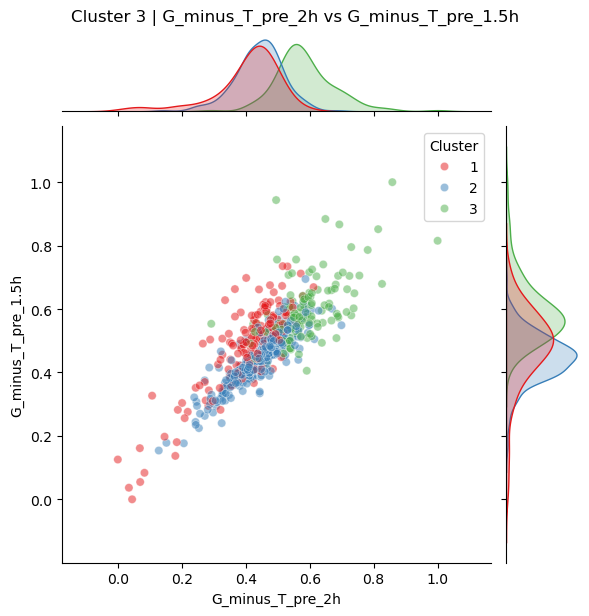

In [155]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
from sklearn.preprocessing import MinMaxScaler

# === 1) MinMaxScaler로 0–1 변환 ===
scaler = MinMaxScaler()
X_scaled_01 = scaler.fit_transform(X_raw)  # 원본 값 → 0–1 범위로 변환
df_plot_scaled = pd.DataFrame(X_scaled_01, columns=FEATURES, index=X_with_cluster.index)

# === 2) 클러스터 라벨 붙이기 ===
df_plot_scaled["Cluster"] = X_with_cluster["Cluster"]

# === 3) SHAP 값 DataFrame 준비 ===
shap_df = pd.DataFrame(shap_pos_clipped, columns=FEATURES, index=X_with_cluster.index)
shap_df["Cluster"] = X_with_cluster["Cluster"]

# === 4) 클러스터별 평균 SHAP 기반 Top5 features 뽑기 (outlier 제외) ===
cluster_means = shap_df.groupby("Cluster").mean()
top_feats = {
    clust: cluster_means.loc[clust].sort_values(ascending=False).head(5).index.tolist()
    for clust in cluster_means.index if (X_with_cluster["Cluster"] == clust).sum() > 1
}

print("=== Top5 features per cluster (from SHAP) ===")
for clust, feats in top_feats.items():
    print(f"Cluster {clust}: {feats}")

# === 5) Outlier 제외 (샘플 수 > 1 인 클러스터만) ===
valid_clusters = [clust for clust in top_feats.keys()]
df_plot_scaled = df_plot_scaled[df_plot_scaled["Cluster"].isin(valid_clusters)]

# === 6) 각 클러스터별 Top5 feature 조합 시각화 ===
for clust, feats in top_feats.items():
    print(f"\n=== Cluster {clust} ===")
    for f1, f2 in itertools.combinations(feats, 2):
        print(f"Plotting {f1} vs {f2}")
        g = sns.jointplot(
            data=df_plot_scaled,
            x=f1, y=f2,
            hue="Cluster",
            kind="scatter",
            palette="Set1",
            alpha=0.5,
            marginal_kws=dict(common_norm=False, fill=True)  # KDE 옵션
        )
        g.fig.suptitle(f"Cluster {clust} | {f1} vs {f2}", y=1.02)
        plt.show()


=== Top5 features per cluster (from SHAP) ===
Cluster 1: ['Time_24h', 'mean_intensity_1h', 'Z_Previous_4', '15m_G_Diff_7', '15m_G_Diff_5']
Cluster 2: ['Time_24h', 'mean_intensity_1h', 'hungry', 'How_stressed', '15m_G_Diff_7']
Cluster 3: ['Z_Previous_4', 'Time_24h', 'mean_intensity_1h', 'G_minus_T_pre_2h', 'G_minus_T_pre_1.5h']

=== Cluster 1 ===
Plotting Time_24h vs mean_intensity_1h


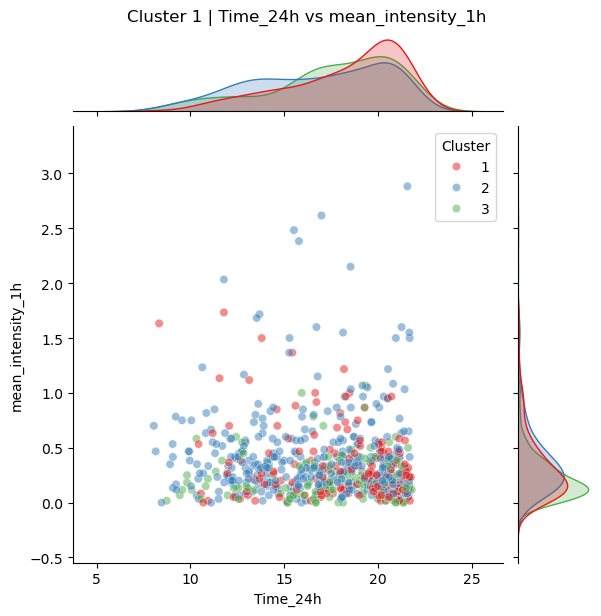

Plotting Time_24h vs Z_Previous_4


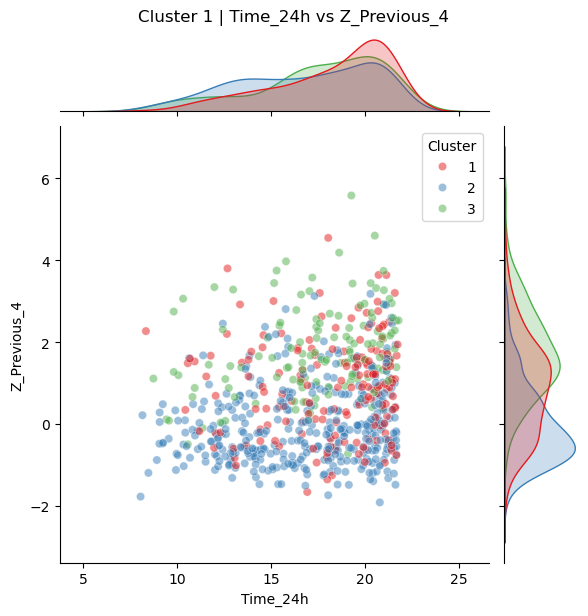

Plotting Time_24h vs 15m_G_Diff_7


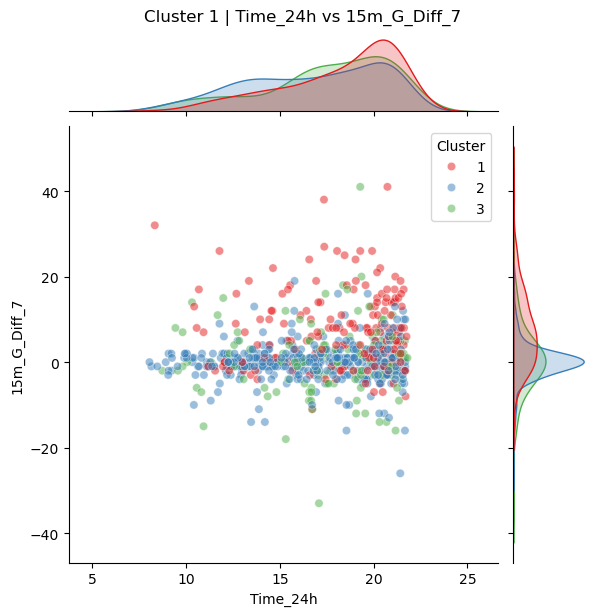

Plotting Time_24h vs 15m_G_Diff_5


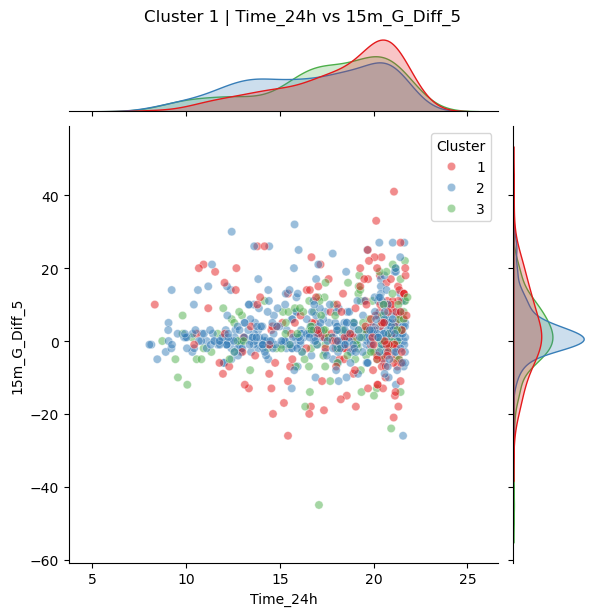

Plotting mean_intensity_1h vs Z_Previous_4


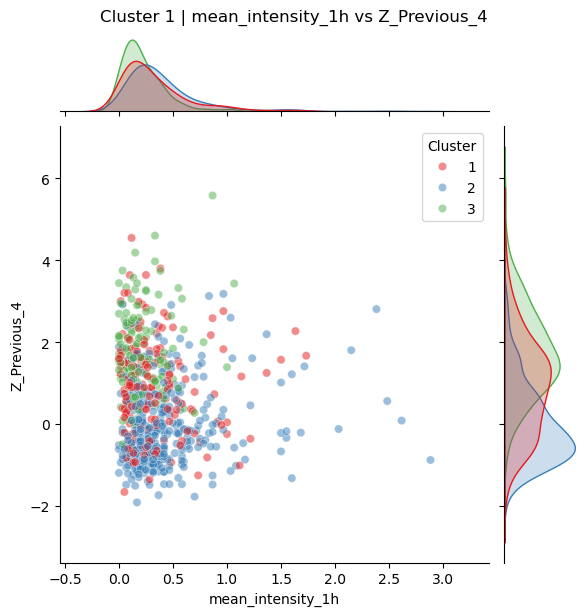

Plotting mean_intensity_1h vs 15m_G_Diff_7


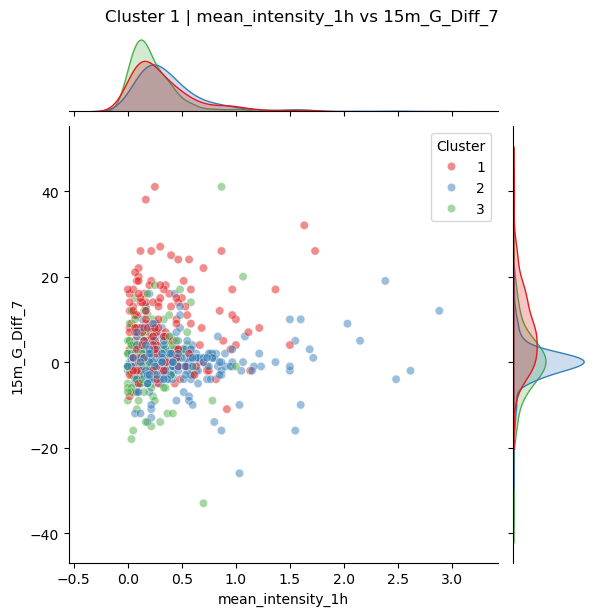

Plotting mean_intensity_1h vs 15m_G_Diff_5


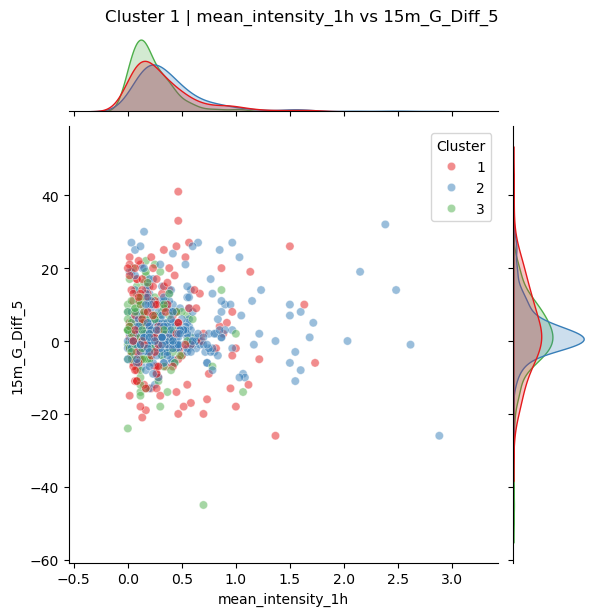

Plotting Z_Previous_4 vs 15m_G_Diff_7


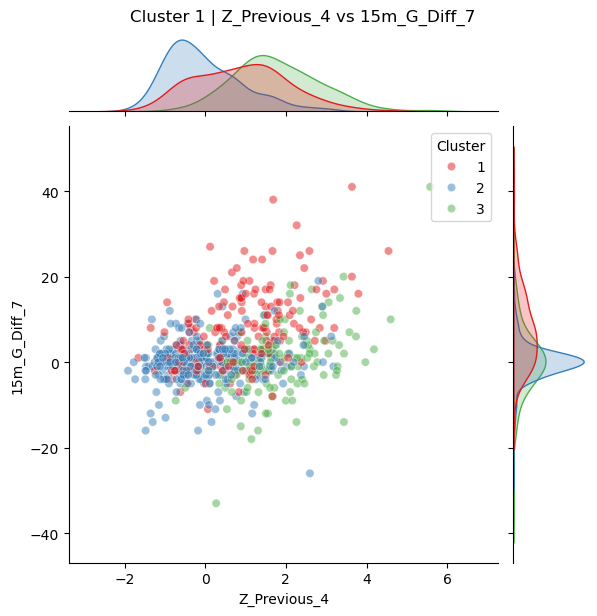

Plotting Z_Previous_4 vs 15m_G_Diff_5


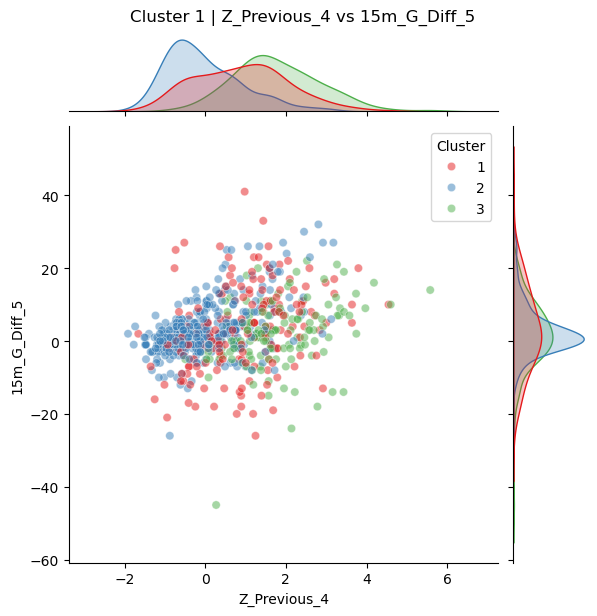

Plotting 15m_G_Diff_7 vs 15m_G_Diff_5


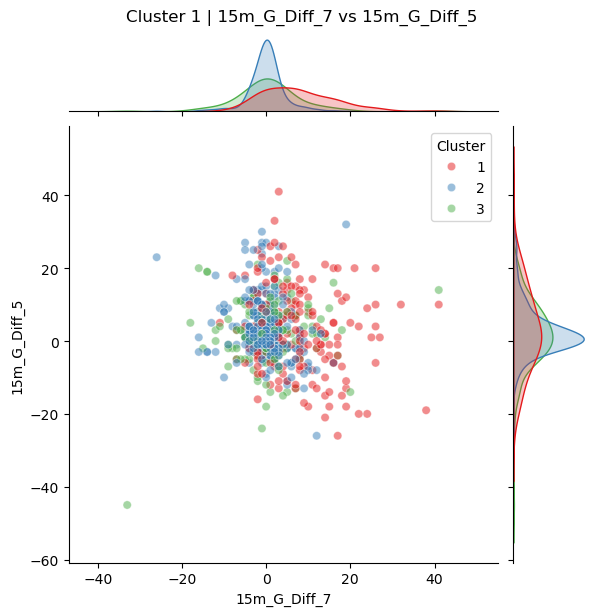


=== Cluster 2 ===
Plotting Time_24h vs mean_intensity_1h


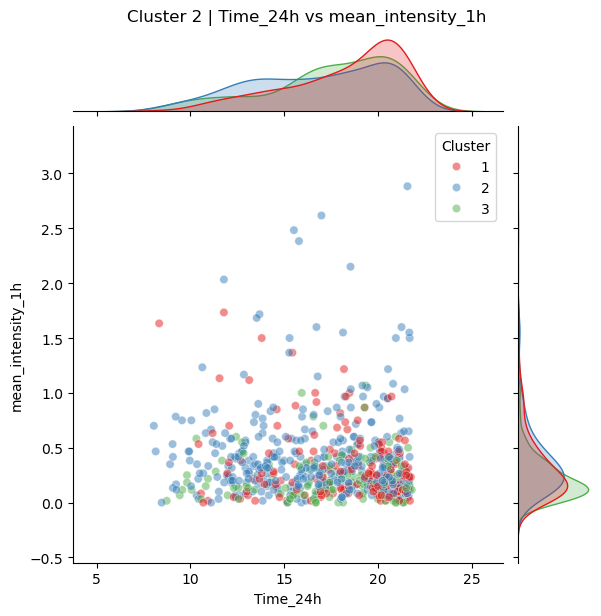

Plotting Time_24h vs hungry


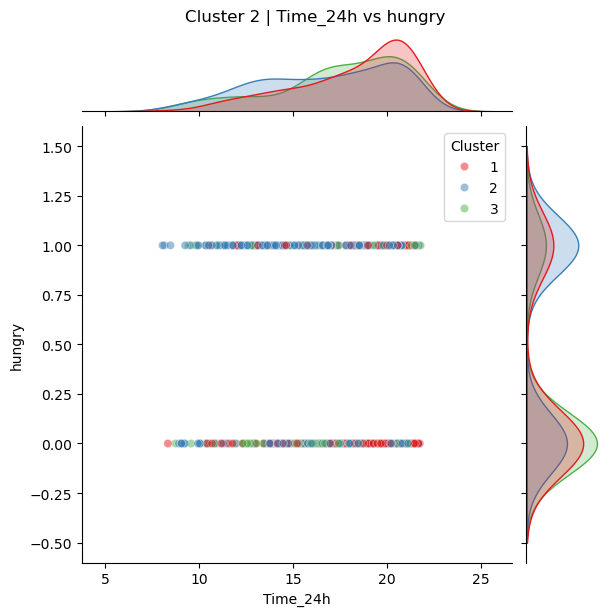

Plotting Time_24h vs How_stressed


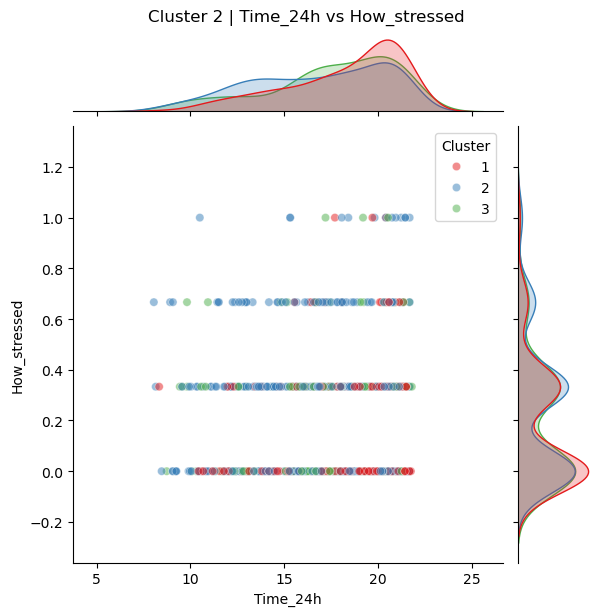

Plotting Time_24h vs 15m_G_Diff_7


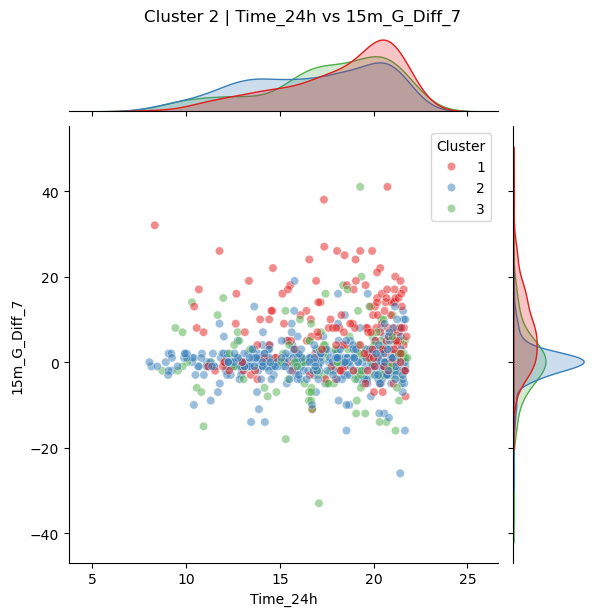

Plotting mean_intensity_1h vs hungry


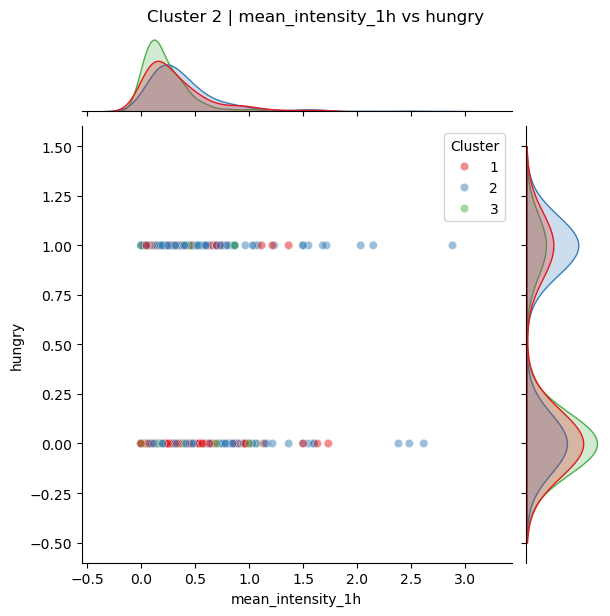

Plotting mean_intensity_1h vs How_stressed


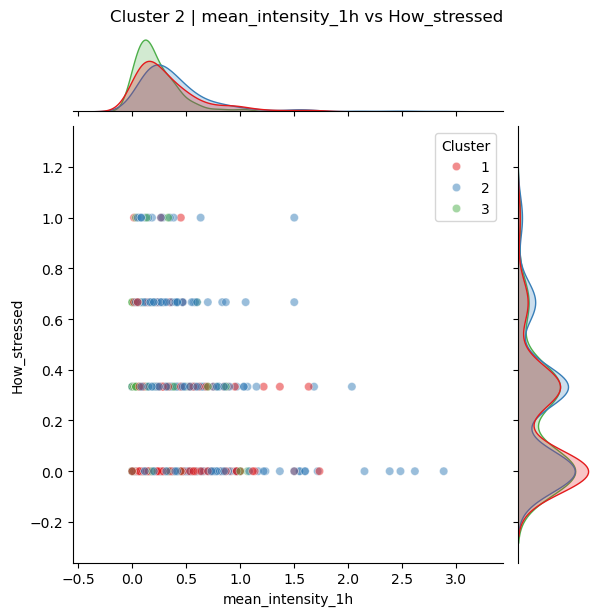

Plotting mean_intensity_1h vs 15m_G_Diff_7


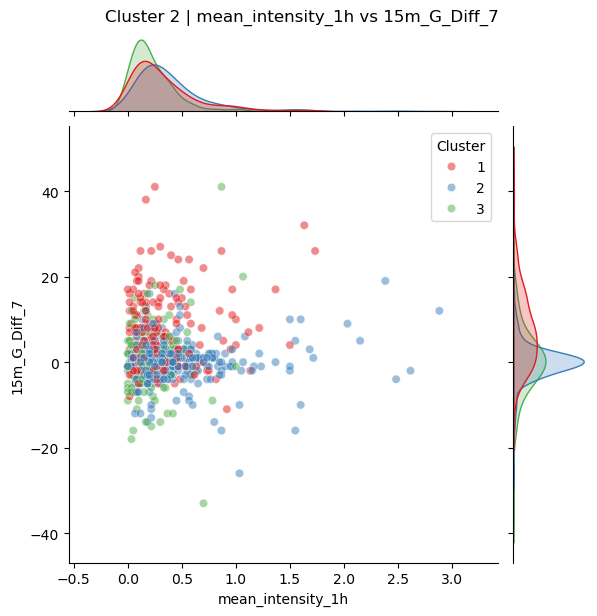

Plotting hungry vs How_stressed


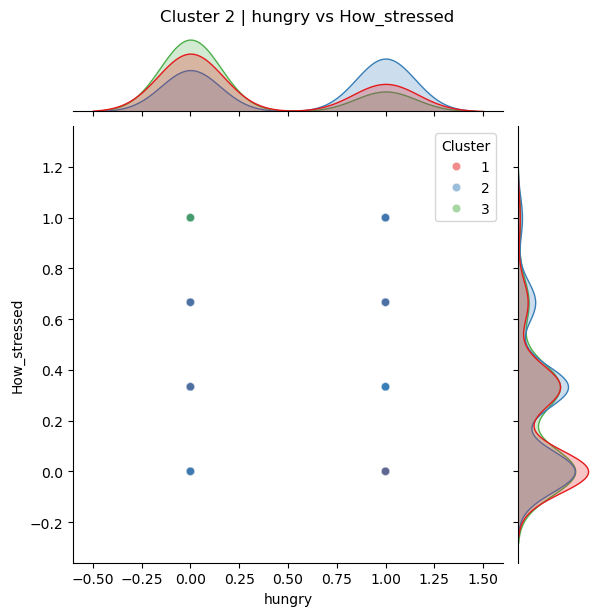

Plotting hungry vs 15m_G_Diff_7


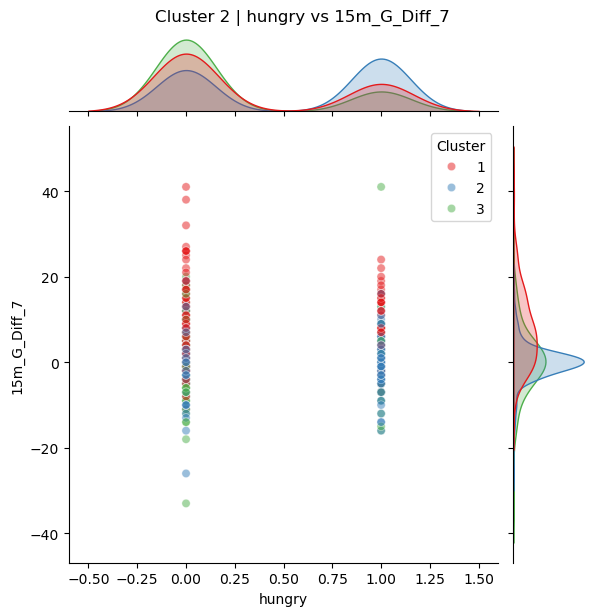

Plotting How_stressed vs 15m_G_Diff_7


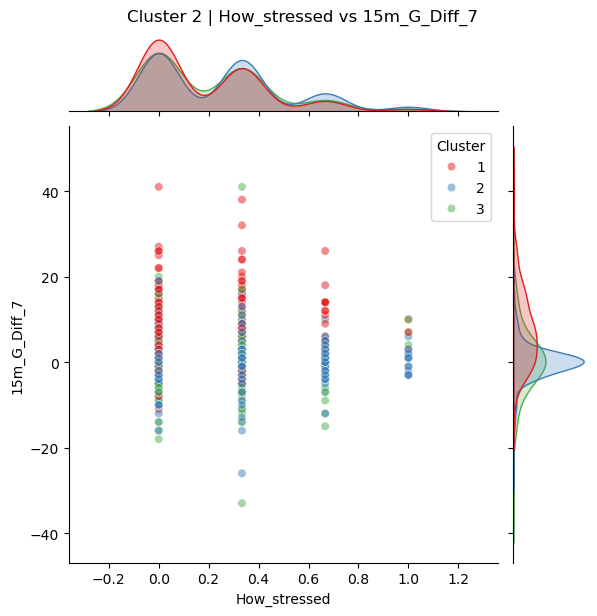


=== Cluster 3 ===
Plotting Z_Previous_4 vs Time_24h


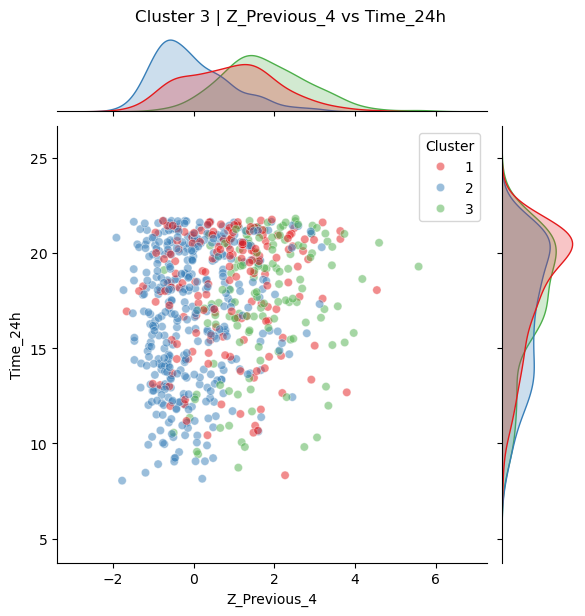

Plotting Z_Previous_4 vs mean_intensity_1h


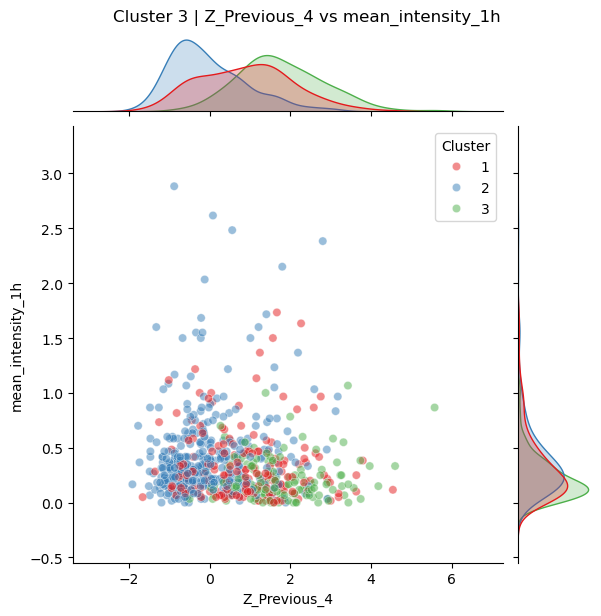

Plotting Z_Previous_4 vs G_minus_T_pre_2h


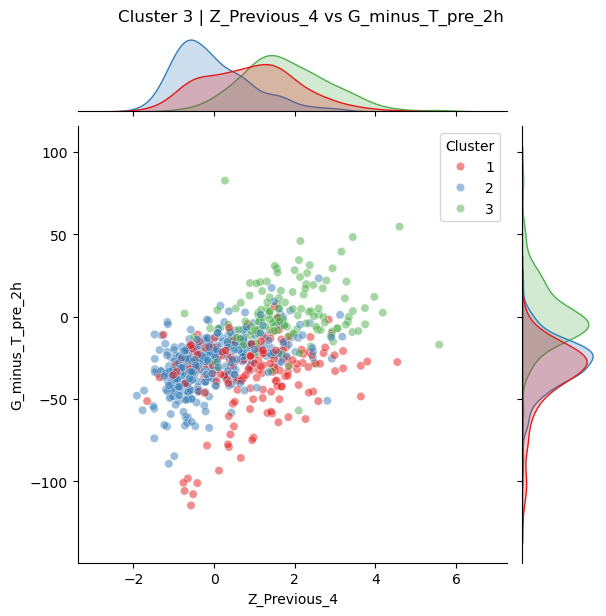

Plotting Z_Previous_4 vs G_minus_T_pre_1.5h


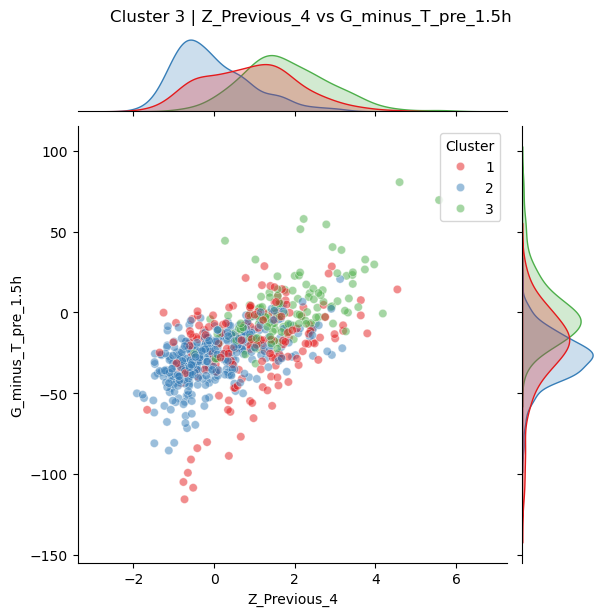

Plotting Time_24h vs mean_intensity_1h


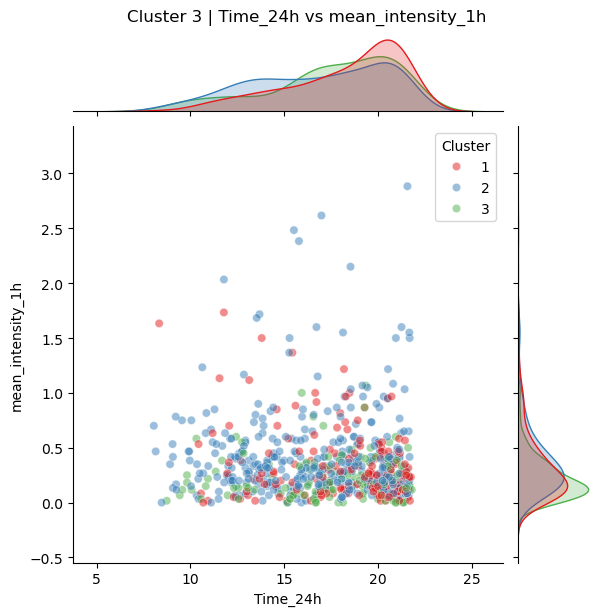

Plotting Time_24h vs G_minus_T_pre_2h


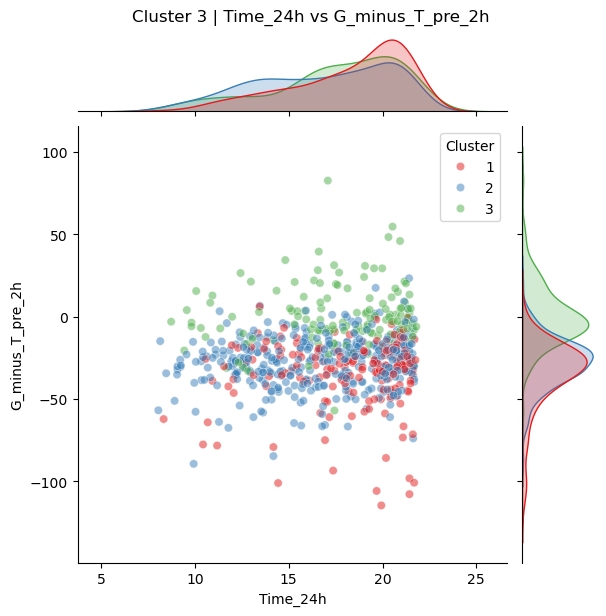

Plotting Time_24h vs G_minus_T_pre_1.5h


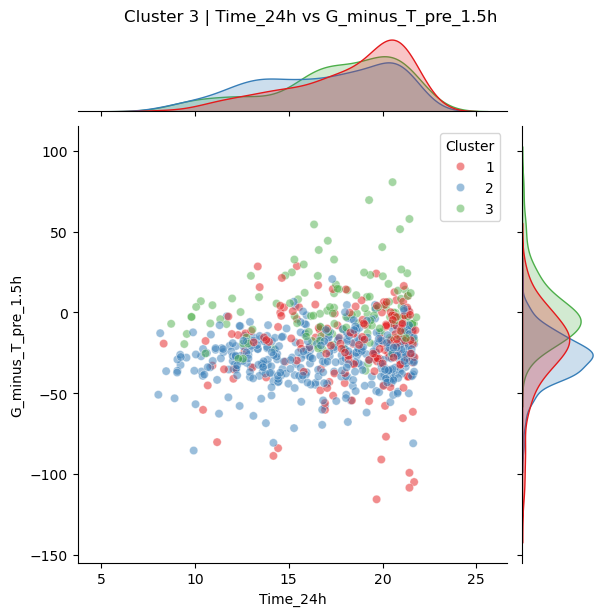

Plotting mean_intensity_1h vs G_minus_T_pre_2h


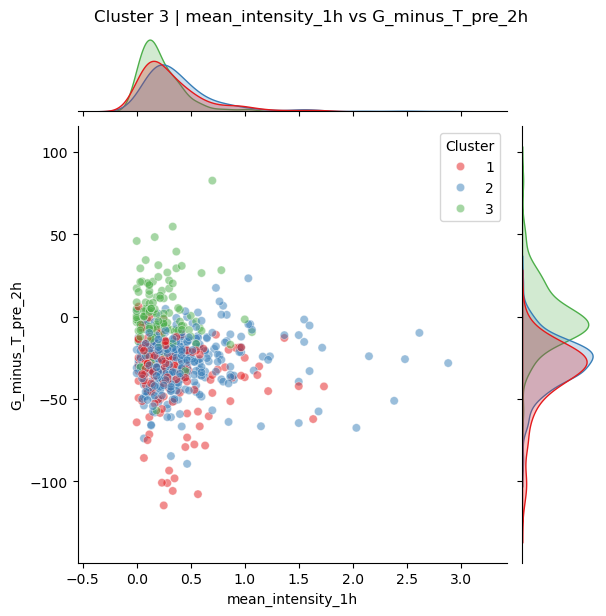

Plotting mean_intensity_1h vs G_minus_T_pre_1.5h


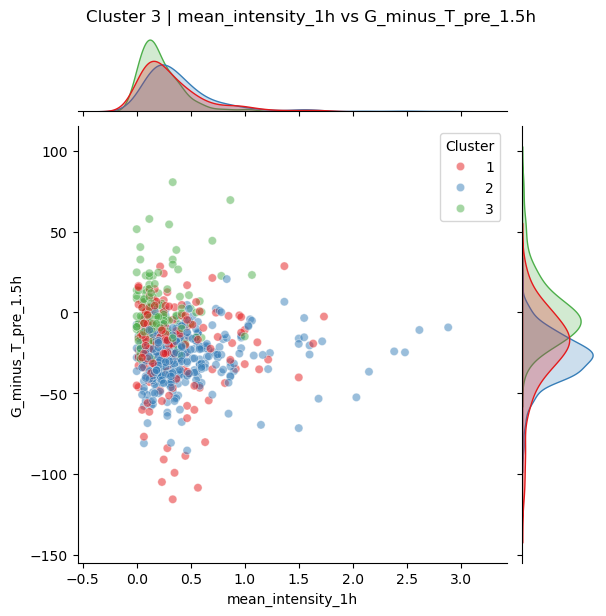

Plotting G_minus_T_pre_2h vs G_minus_T_pre_1.5h


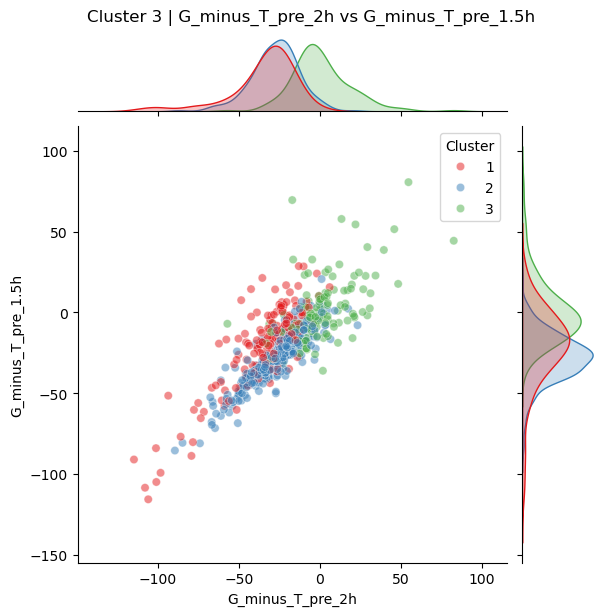

In [163]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

# === 1) 원본 값 DataFrame 사용 ===
df_plot_raw = pd.DataFrame(X_raw, columns=FEATURES, index=X_with_cluster.index)

# === 2) 클러스터 라벨 붙이기 ===
df_plot_raw["Cluster"] = X_with_cluster["Cluster"]

# === 3) SHAP 값 DataFrame 준비 ===
shap_df = pd.DataFrame(shap_pos_clipped, columns=FEATURES, index=X_with_cluster.index)
shap_df["Cluster"] = X_with_cluster["Cluster"]

# === 4) 클러스터별 평균 SHAP 기반 Top5 features 뽑기 (outlier 제외) ===
cluster_means = shap_df.groupby("Cluster").mean()
top_feats = {
    clust: cluster_means.loc[clust].sort_values(ascending=False).head(5).index.tolist()
    for clust in cluster_means.index if (X_with_cluster["Cluster"] == clust).sum() > 1
}

print("=== Top5 features per cluster (from SHAP) ===")
for clust, feats in top_feats.items():
    print(f"Cluster {clust}: {feats}")

# === 5) Outlier 제외 (샘플 수 > 1 인 클러스터만) ===
valid_clusters = [clust for clust in top_feats.keys()]
df_plot_raw = df_plot_raw[df_plot_raw["Cluster"].isin(valid_clusters)]

# === 6) 각 클러스터별 Top5 feature 조합 시각화 ===
for clust, feats in top_feats.items():
    print(f"\n=== Cluster {clust} ===")
    for f1, f2 in itertools.combinations(feats, 2):
        print(f"Plotting {f1} vs {f2}")
        g = sns.jointplot(
            data=df_plot_raw,
            x=f1, y=f2,
            hue="Cluster",
            kind="scatter",
            palette="Set1",
            alpha=0.5,
            marginal_kws=dict(common_norm=False, fill=True)  # KDE 옵션
        )
        g.fig.suptitle(f"Cluster {clust} | {f1} vs {f2}", y=1.02)
        plt.show()


## The variable distributions were similar to those observed with k=2. 
## Excluding the outlier, Cluster 1 from k=2 split into Clusters 1 and 2 at k=4, while Cluster 2 from k=2 corresponded to Cluster 3 at k=4, showing overall similar patterns